# Tagup data science challenge

ExampleCo, Inc has a problem: maintenance on their widgets is expensive. They have contracted with Tagup to help them implement predictive maintenance. They want us to provide a model that will allow them to prioritize maintenance for those units most likely to fail, and in particular to gain some warning---even just a few hours!---before a unit does fail.

They collect two kinds of data for each unit. First, they have a remote monitoring system for the motors in each unit, which collects information about the motor (rotation speed, voltage, current) as well as two temperature probes (one on the motor and one at the inlet). Unfortunately, this system is antiquated and prone to communication errors, which manifest as nonsense measurements. Second, they have a rule-based alarming system, which can emit either warnings or errors; the system is known to be noisy, but it's the best they've got. 

They have given us just over 100MB of historical remote monitoring data from twenty of their units that failed in the field. The shortest-lived units failed after a few days; the longest-lived units failed after several years. Typical lifetimes are on the order of a year. This data is available in .csv files under `data/train` in this repository. In addition, they have provided us with operating data from their thirty active units for the past month; this data is available under `data/test` in this repository.

You have two main objectives. First, **tell us as much as you can about the process that generated the data**. Does it show meaningful clustering? Do the observations appear independent? How accurately can we forecast future observations, and how long a window do we need to make an accurate forecast? Feel free to propose multiple models, but be sure to discuss the ways each is useful and the ways each is not useful. Second, **predict which of the thirty active units are most likely to fail**. The data from these units are in `data/test`. Be sure to quantify these predictions, and especially your certainty.

A few notes to help:
1. A good place to start is by addressing the noise due to comm errors. 
2. There is a signal in the data that you can identify and exploit to predict failure.
3. If you can't find the signal in the noise, don't despair! We're much more interested in what you try and how you try it than in how successful you are at helping a fictional company with their fictional problems.
4. Feel free to use any libraries you like, or even other programming languages. Your final results should be presented in this notebook, however.
5. There are no constraints on the models or algorithms you can bring to bear. Some ideas include: unsupervised clustering algorithms such as k-means; hidden Markov models; forecasting models like ARMA; neural networks; survival models built using features extracted from the data; etc.
6. Don't feel compelled to use all the data if you're not sure how. Feel free to focus on data from a single unit if that makes it easier to get started.
7. Be sure to clearly articulate what you did, why you did it, and how the results should be interpreted. In particular you should be aware of the limitations of whatever approach or approaches you take.
8. Don't hesitate to reach out with any questions.

In [1]:
# To help you get started...
%matplotlib notebook 
# %matplotlib notebook
from IPython.display import display
import pandas as pd
import matplotlib.pyplot as plt

#loading from custom module for ease of formatting. Simple iteration over files in the data folder. 
from data_processing.loading import load_folder, load_rms, load_alarms

#loading all data from train folder:
all_data = load_folder("data/train")


In [29]:
#Handling communication errors:
#Points where a communication error occured are 'junk' - i.e. not just noisy, but
#unrelated to the underlying signal in the data, 
#These communication error points can be characterized, qualitatively,
#by a sharp (often orders of magnitude higher or lower) deviation from the data points in its immediate 
#past and future. 

#My first attempt at performing this filtering relied on a Median Absolute Deviation-based smoothing technique -
#detecting points that deviated from the median by a certain threshold, removing them, and interpolating to fill 
#gaps. However, this approach was slow, and later experimentation showed that simple median smoothing sufficed,
#and had similar properties with respect to outlier robustness. Code from the previous attempt can still be found in
#the data_processing folder. 

#As well, I performed scaling using a MinMaxScaler, to better analyze inter-timeseries trends. The data 

#Comments:
#As implemented, this approach uses each sensor data timeseries as a separate, univariate timeseries, 
#not taking advantage of co-temporal sensory data to select outliers. As well, it does not use an underlying prediction model
#to do so; I thought it prudent to prune obvious errors using a simple smoothing rule before fitting a model to the data,
#given the extreme magnitude of the communication errors. 

import numpy as np
from data_processing.preprocessing import preprocess_rms, add_power_feature, add_temp_diff, add_torque

#performing noise filtering
from sklearn.preprocessing import  MinMaxScaler

window_size = 10

for item in all_data.keys():
    
    scaler = MinMaxScaler()
    print("preprocessing {}".format(item))
    rms = all_data[item]['rms'].rolling(window_size, center=True).median()
    
    #truncating first window_size-1 
    rms = rms.dropna()
    #converting index to datetime
    rms.index = pd.to_datetime(rms.index)
    add_power_feature(rms)
    add_temp_diff(rms)
    add_torque(rms)

    all_data[item]['rms_smoothed'] = rms.copy()
    
    #standard scaling
    
    rms[rms.columns] = scaler.fit_transform(rms[rms.columns])
    
    all_data[item]['rms_normalized'] = rms
    



preprocessing unit0009
preprocessing unit0006
preprocessing unit0016
preprocessing unit0018
preprocessing unit0002
preprocessing unit0007
preprocessing unit0010
preprocessing unit0003
preprocessing unit0005
preprocessing unit0004
preprocessing unit0019
preprocessing unit0014
preprocessing unit0012
preprocessing unit0011
preprocessing unit0000
preprocessing unit0013
preprocessing unit0017
preprocessing unit0008
preprocessing unit0015
preprocessing unit0001


In [56]:
#Incorporating alarm values

#A reasonable assumption here is that each data point represents a sample taken in a 10-minute interval,
#providing a "discretization" of the data without requiring binning or resampling.

#This piece incorporates warnings into the timeseries by marking whether or not a warning occured between each observation
#and the following observation. 

#To incorporate warnings, marks whether or not a warning occured between each observation
#and the following observation. 
from data_processing.preprocessing import add_alarms

for item in all_data.keys():
    print("adding alarms to {}".format(item))
    add_alarms(all_data[item]['rms_smoothed'], all_data[item]['alarms'])
    add_alarms(all_data[item]['rms_normalized'], all_data[item]['alarms'])



adding alarms to unit0009
adding alarms to unit0006
adding alarms to unit0016
adding alarms to unit0018
adding alarms to unit0002
adding alarms to unit0007
adding alarms to unit0010
adding alarms to unit0003
adding alarms to unit0005
adding alarms to unit0004
adding alarms to unit0019
adding alarms to unit0014
adding alarms to unit0012
adding alarms to unit0011
adding alarms to unit0000
adding alarms to unit0013
adding alarms to unit0017
adding alarms to unit0008
adding alarms to unit0015
adding alarms to unit0001


# Domain Knowledge and Feature Notes

Before embarking on analysis and modeling, I thought it would be useful to discuss possible sources of signal and noise, as well as using domain knowlege to inform my search for the predictive signal. 

The motor is an electrical system designed to perform mechanical work. Therefore, the power draw (product of current and voltage) is an important time-varying characteristic of the motor that may serve as an indicator (or component of an indicator) of system health. A large jump in power draw, or shift in power use pattern, may damage the motor. Similarly, the torque currently exerted by the motor, assuming some constant loss converting electrical power to mechanical power, can be calculated by dividing the power by the revolutions-per-minute (RPM) of the motor mechanism. Periods in which torque is high may exact stress on the motor, for example. The temperature difference between between the intake and motor might serve as an indicator of a problem, if the motor is overheating due to some internal issue. 

All of these features have been added to the RMS DataFrame in the preprocessing step; code can be found in my data_processing module. 

As well, motors are typically rated with respect to a duty cycle - motors with specific operational cycles may be more vulnerable to failures. 

Further domain knowledge could come in handy, such as the speed equation for a DC motor (https://en.wikipedia.org/wiki/Brushed_DC_electric_motor) - from observations in the data, a model of the motor resistance and flux could be fit. The motor resistance may increase if a problem is occuring. Assuming that the motors are DC motors, of course. Off the top of my head, a Hough transform-like curve fitting procedure could generate candidate values for flux and resistance in different phases of operation.  



<IPython.core.display.Javascript object>


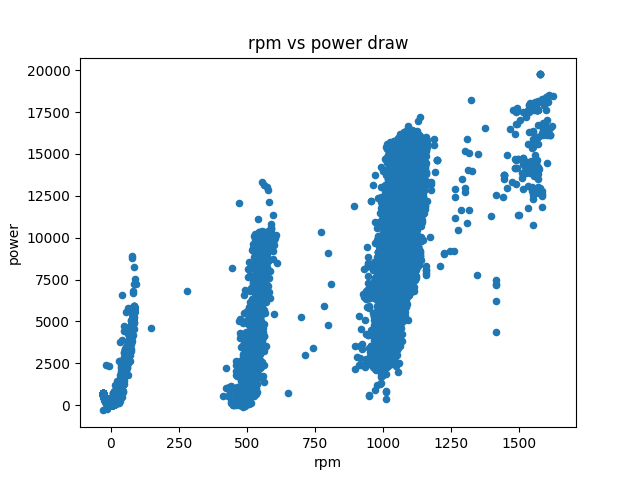

<IPython.core.display.Javascript object>


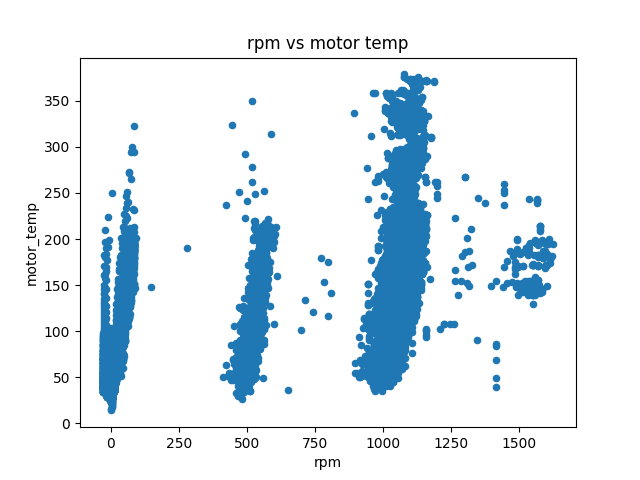

<IPython.core.display.Javascript object>


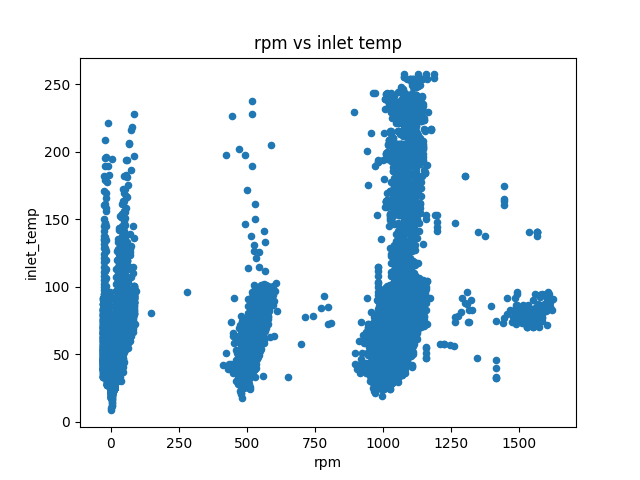

<IPython.core.display.Javascript object>


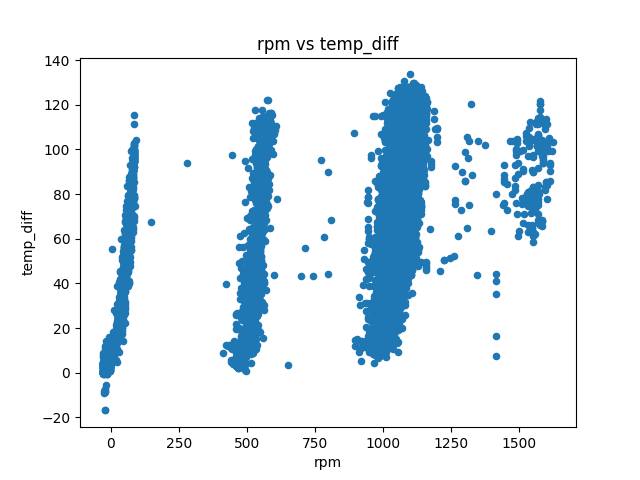

<IPython.core.display.Javascript object>


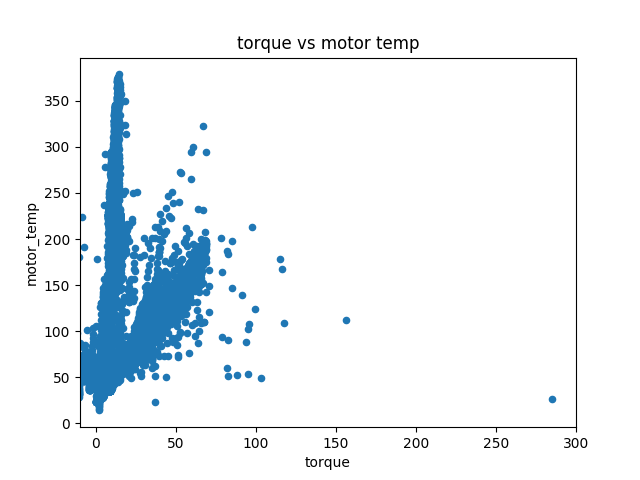

<IPython.core.display.Javascript object>


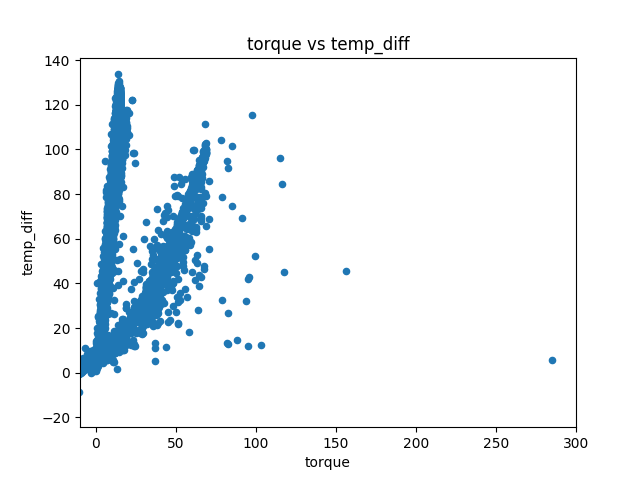

<IPython.core.display.Javascript object>


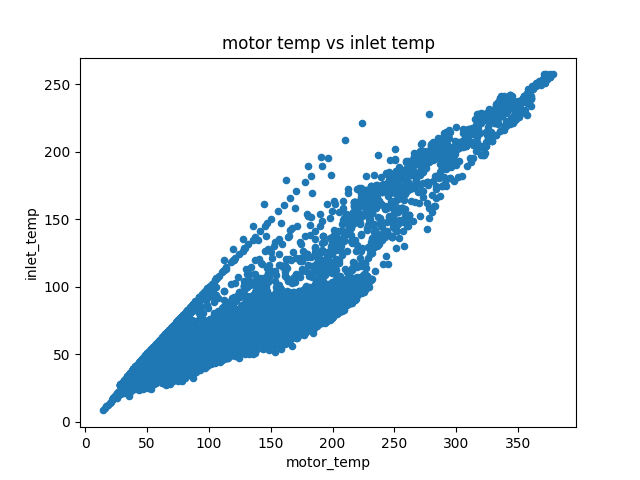

<IPython.core.display.Javascript object>


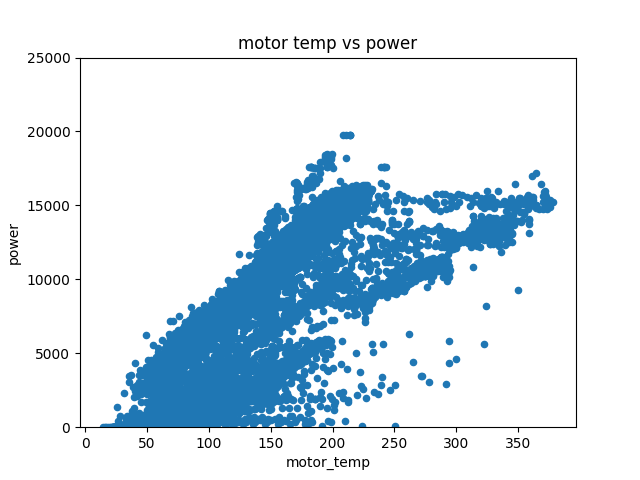

<IPython.core.display.Javascript object>


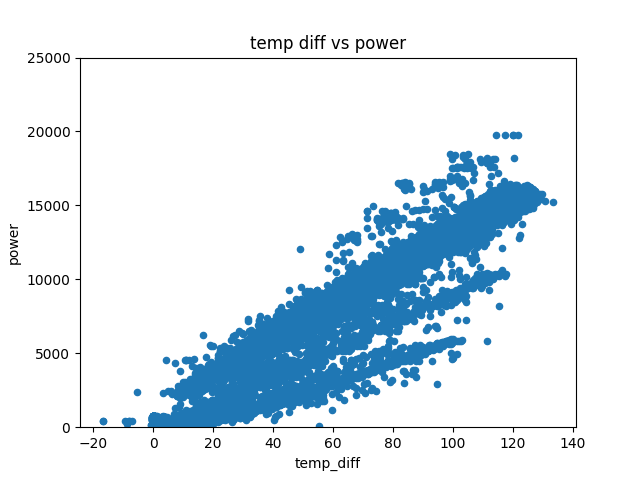

<IPython.core.display.Javascript object>


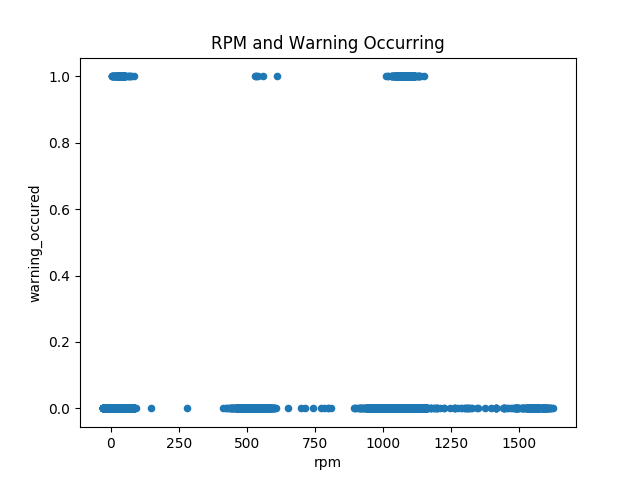

<IPython.core.display.Javascript object>


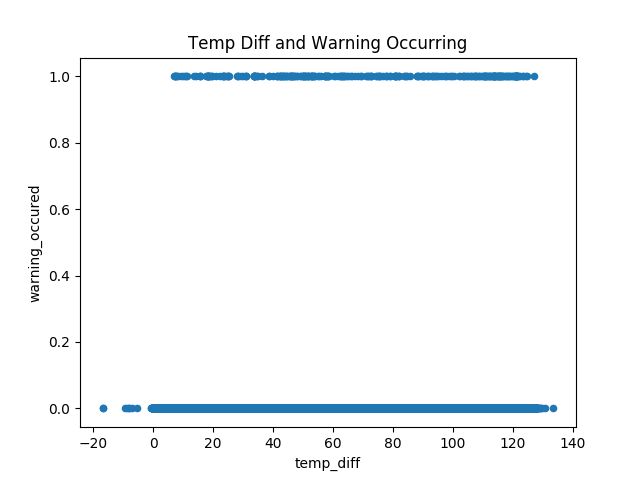

<IPython.core.display.Javascript object>


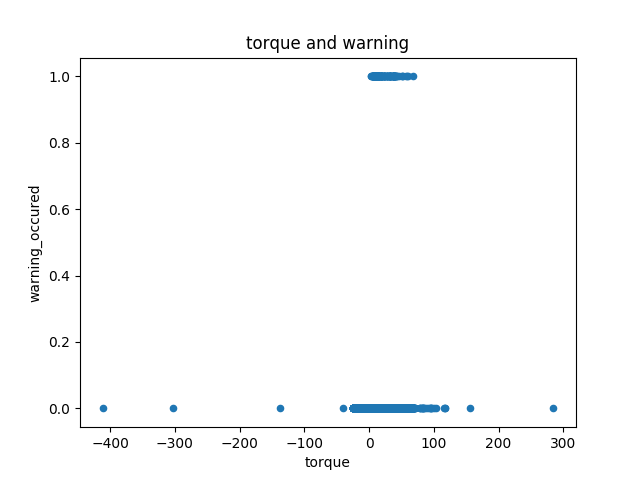

<IPython.core.display.Javascript object>


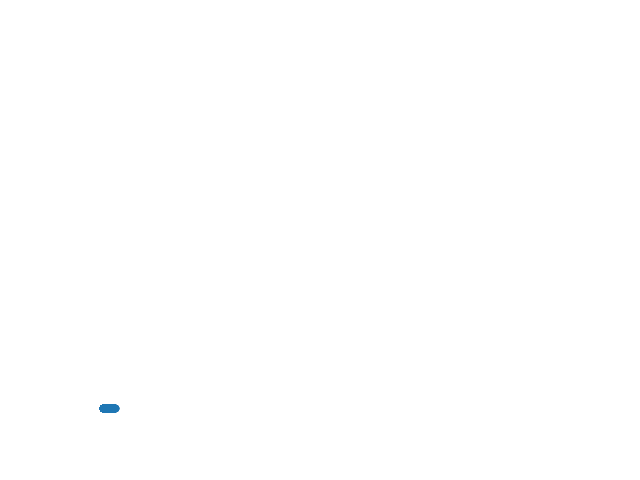

In [17]:
#Performing exploratory plotting of one of the data sets.

#The goal here is to get a qualitative sense of how the data cluster in different
#axes, to inform model choice as well as gather insight about the behavior of the system. 

unit_0000 = all_data['unit0000']['rms_smoothed']


# data_filtered.plot.scatter("rpm", "current", title="rpm vs current")
# data_filtered.plot.scatter("rpm", "voltage", title="rpm vs voltage")
unit_0000.plot.scatter("rpm", "power", title="rpm vs power draw")
#these all cluster fairly similarly, with four "clusters"
#One for low-speed operation, one where ramping is occurring, one for "normal" operation, one for
#high-RPM operation.
#Interestingly, there appear to be points where power draw is extremely low and extremely high
#even while RPM is low. These may indicate high-torque events.  

unit_0000.plot.scatter("rpm", "motor_temp", title="rpm vs motor temp")
unit_0000.plot.scatter("rpm", "inlet_temp", title="rpm vs inlet temp")
unit_0000.plot.scatter("rpm", "temp_diff", title="rpm vs temp_diff")
#similar pattern here, plotted with respect to RPM. There are points in time where the motor is very hot and 
#not moving, as well as cold and not moving. The spread of the "behaviors" in the power and temp directions is
#surprisingly large.


unit_0000.plot.scatter("torque", "motor_temp", title="torque vs motor temp", xlim=(-10, 300))
#there appear to be extremely low-torque events where the motor gets very hot.

unit_0000.plot.scatter("torque", "temp_diff", title="torque vs temp_diff", xlim=(-10, 300))
#there are two very clear modes of operation here - one relationship where the motor is getting
#extremely hot with little torque, and 

unit_0000.plot.scatter("motor_temp", "inlet_temp", title="motor temp vs inlet temp")
#the relationship is somewhat linear, although a few unique behaviors stick out -
#there is a separate linear relationship with a much higher slope, as well as a "hump"
#that sags below the rest of the pattern. 

unit_0000.plot.scatter("motor_temp", "power", ylim=(-10, 25000), title="motor temp vs power")
#all 'clusters' are relatively close, although there are three noticable regions,
#all resembling linear relationships with different slopes. 

unit_0000.plot.scatter("temp_diff", "power", ylim=(-10, 25000), title="temp diff vs power")
#the two linear relationships are fairly obvious here - there's a  mode of operation
#with a much lower slope than what appears to be the "normal" mode. 

# plotting the relationship between warnings and RPM. 
unit_0000.plot.scatter("rpm", "warning_occured", title="RPM and Warning Occurring")
#looks like warnings occur both operating near zero RPM and when operating "normally".

unit_0000.plot.scatter("temp_diff", "warning_occured", title="Temp Diff and Warning Occurring")
#warnings also occuring when the motor is hotter than the intake, but not always.

unit_0000.plot.scatter("torque", "warning_occured", title="torque and warning")
unit_0000.plot.scatter("power", "warning_occured", title="power and warning occurring")
#no clear relationship here. 



<IPython.core.display.Javascript object>


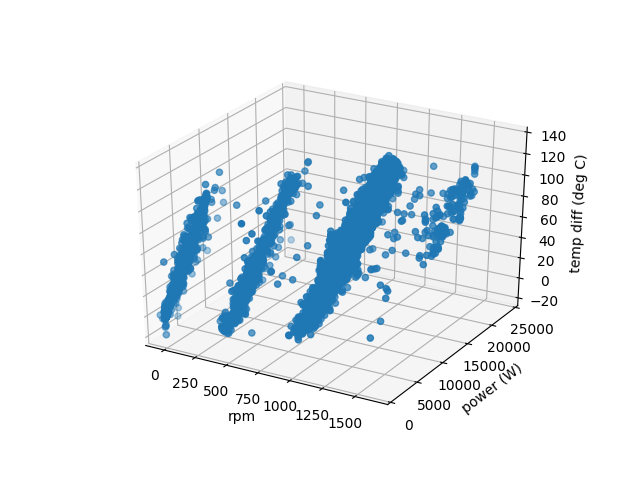

<IPython.core.display.Javascript object>


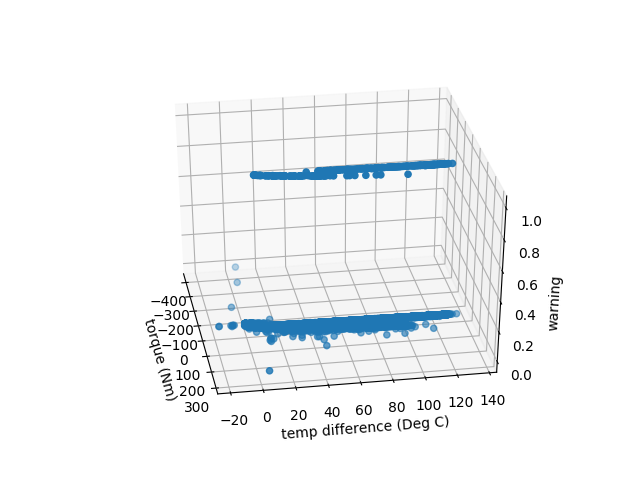

In [16]:
#One step further - plotting 3D scatter plot of rpm, temperature difference, and power draw

from mpl_toolkits.mplot3d import Axes3D
%matplotlib notebook


fig = plt.figure()
ax  = fig.add_subplot(111, projection='3d')

ax.scatter(unit_0000['rpm'], unit_0000['power'], unit_0000['temp_diff'])
ax.set_xlabel("rpm")
ax.set_ylabel("power (W)")
ax.set_ylim((-10, 25000))
ax.set_zlabel("temp diff (deg C)")
plt.show()

#Four distinct modes of operation are visible here, as well -
#(1) a low-RPM mode with variable tempature and power draw
#(2) scattered points that are likely transition points between states
#(3) a medium-RPM mode that likely represents "normal" operation, although
#temperature and power parameters vary
#(4) a high-speed operation mode with high power draw and medium temperature differential.

fig = plt.figure()
ax  = fig.add_subplot(111, projection='3d')

ax.scatter(unit_0000['torque'], unit_0000['temp_diff'], unit_0000['warning_occured'])
ax.set_xlabel("torque (Nm)")
ax.set_ylabel("temp difference (Deg C)")
# ax.set_ylim((-10, 25000))
ax.set_zlabel("warning")
plt.show()

#Too slow to really be useful... 



# Conclusions from Single-Dataset Inspection

The first, and most obvious conclusion is that the data is very multimodal - there are very clearly different distributions that are generating the data during different timesteps. Second, a major source of the difference in operating modes involves a change in the the heat output of the motor for a given unit of power or work. This should inform the model choice as well as the feature representation, indicating that a mode-switching model like a HMM may serve as a good representation of this system's dynamics as they change over time.

<IPython.core.display.Javascript object>


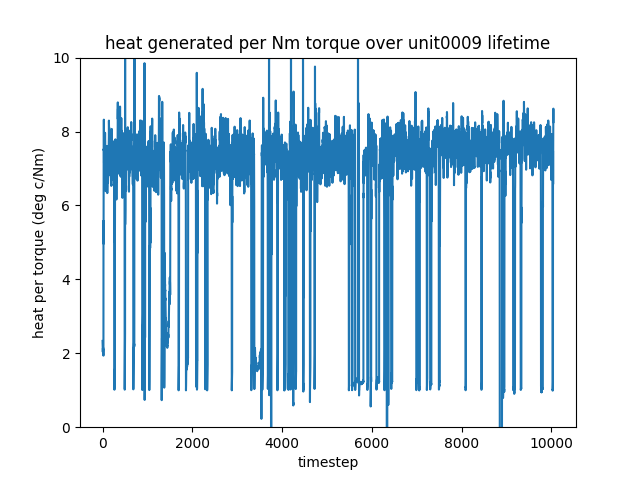

<IPython.core.display.Javascript object>


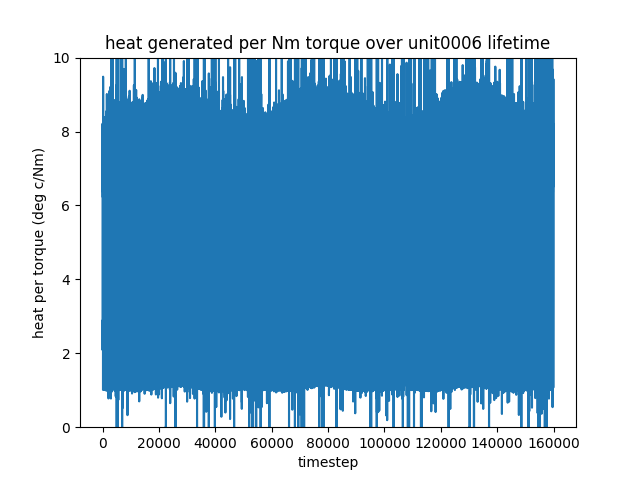

<IPython.core.display.Javascript object>


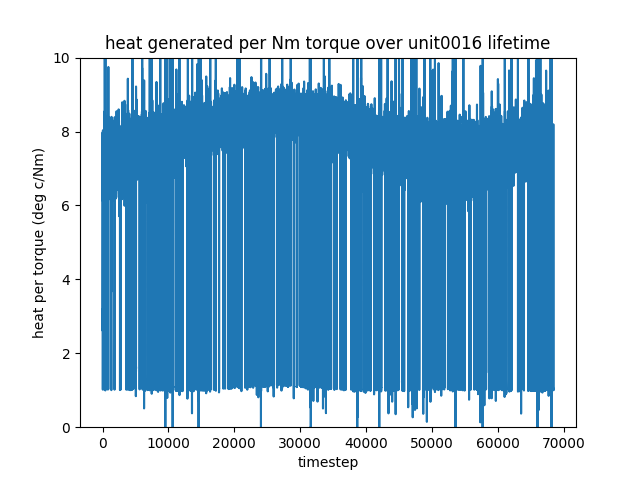

<IPython.core.display.Javascript object>


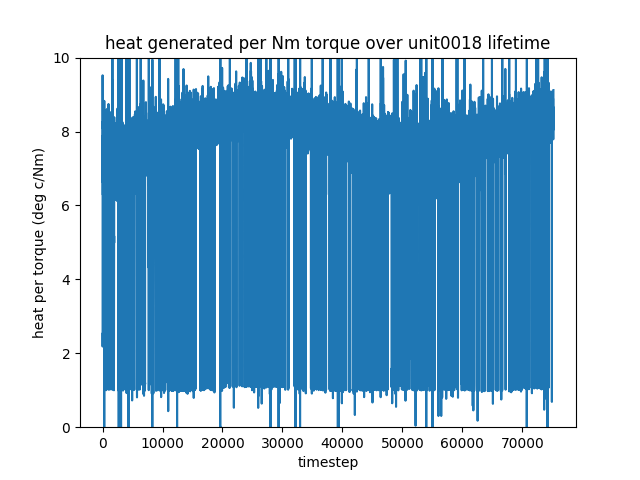

<IPython.core.display.Javascript object>


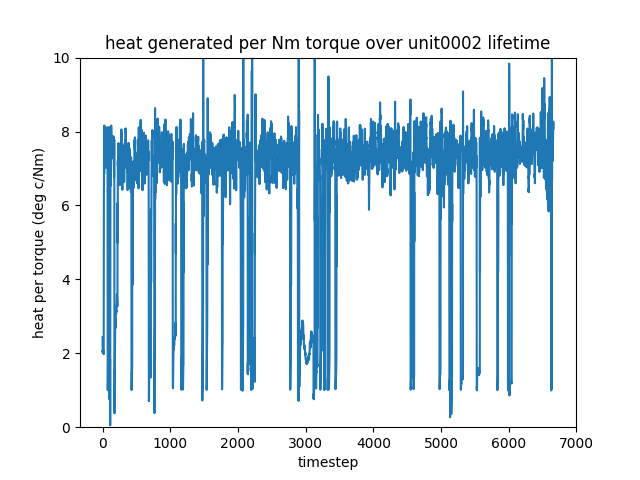

/home/edward/jobsearch/data-science-challenge/.venv/lib/python3.5/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


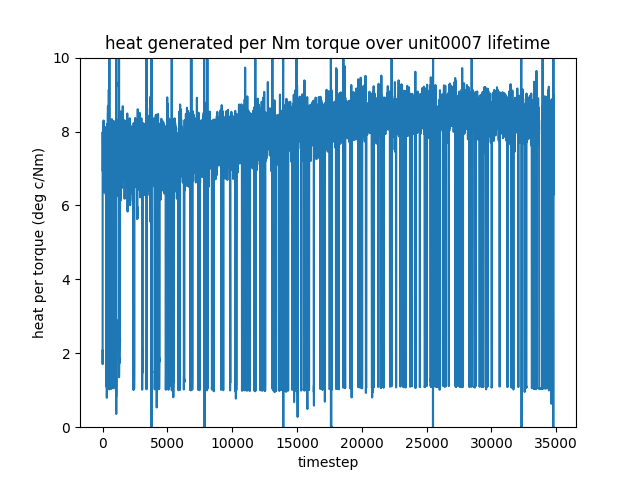

<IPython.core.display.Javascript object>


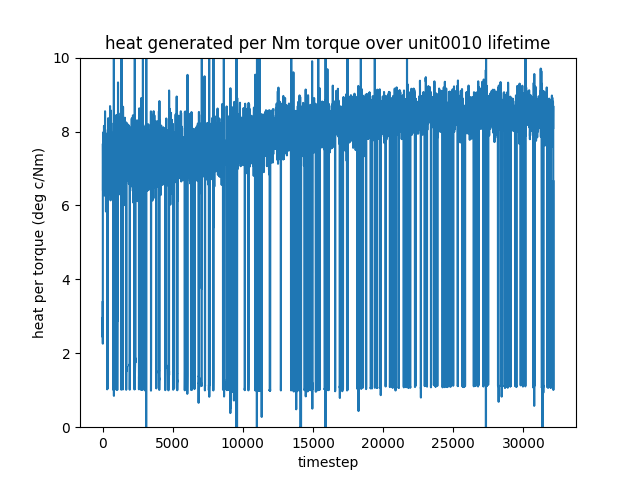

<IPython.core.display.Javascript object>


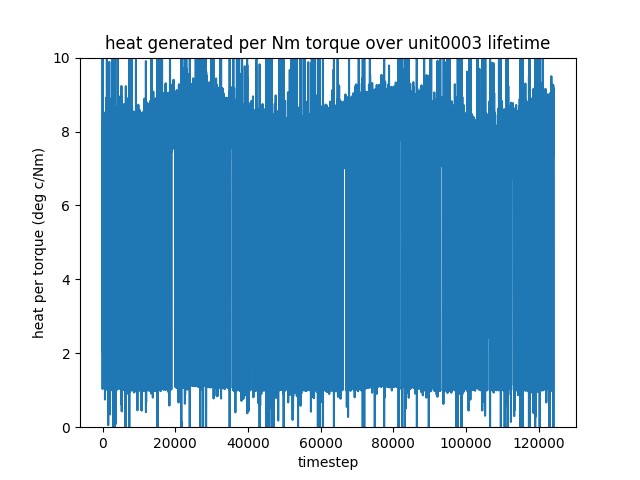

<IPython.core.display.Javascript object>


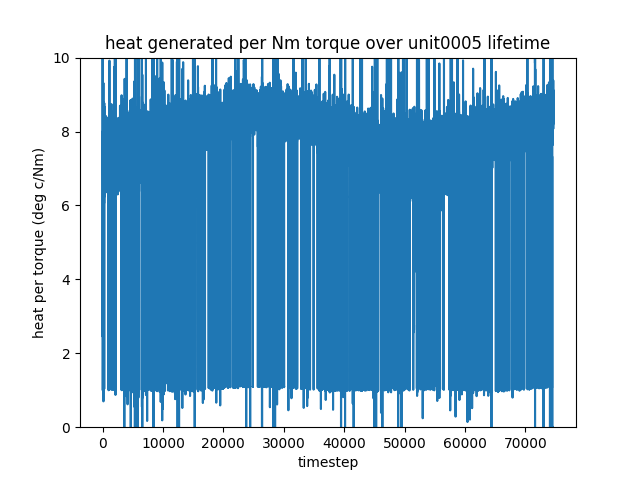

<IPython.core.display.Javascript object>


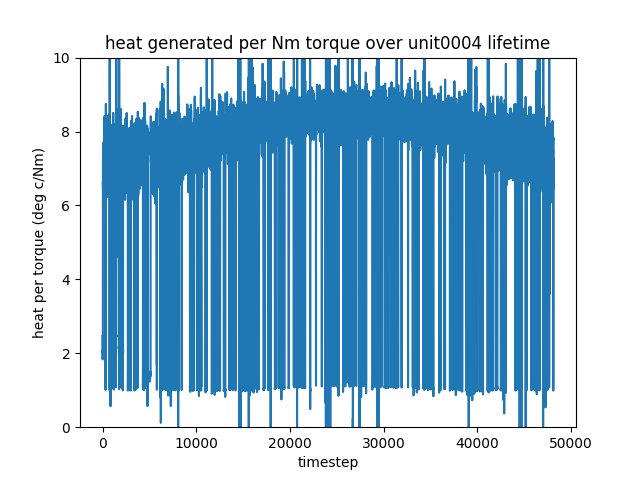

<IPython.core.display.Javascript object>


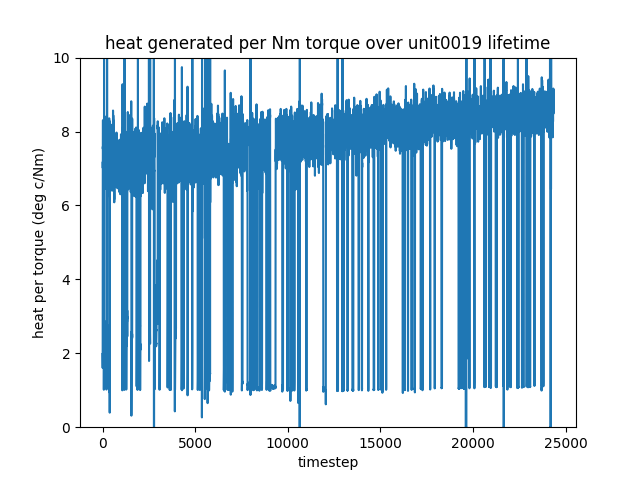

<IPython.core.display.Javascript object>


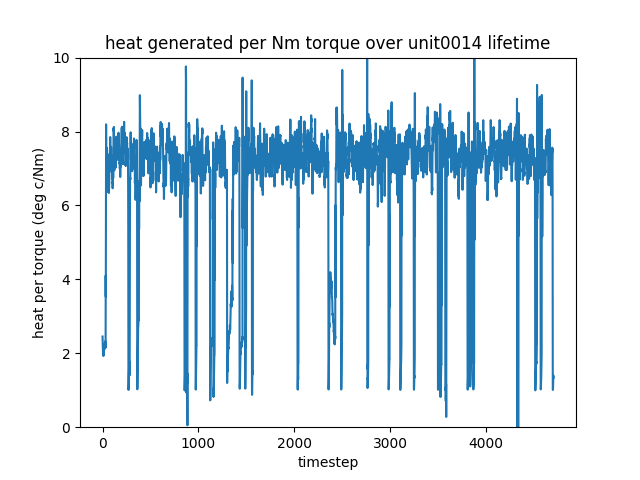

<IPython.core.display.Javascript object>


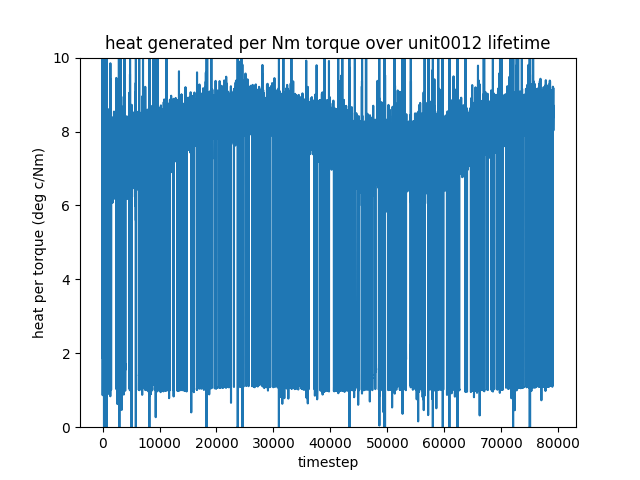

<IPython.core.display.Javascript object>


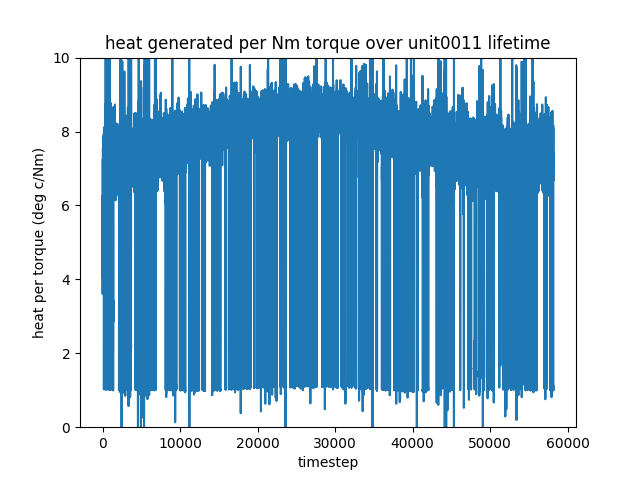

<IPython.core.display.Javascript object>


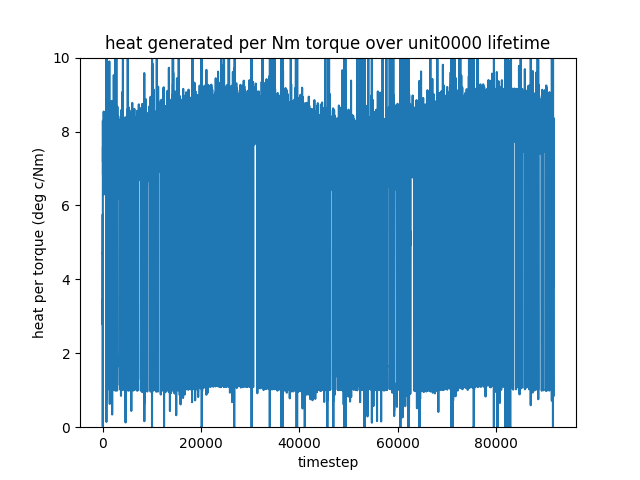

<IPython.core.display.Javascript object>


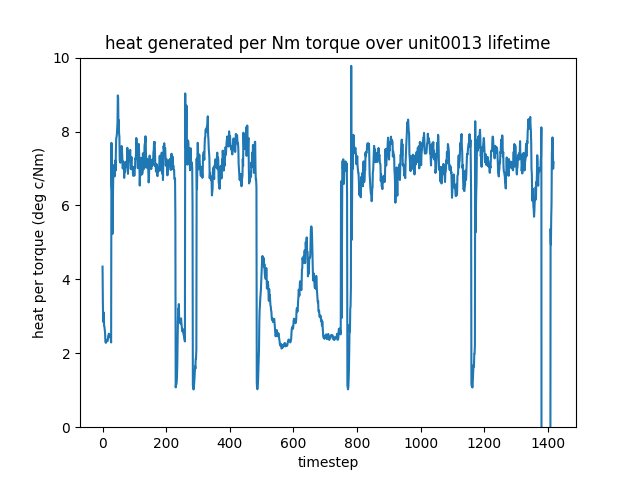

<IPython.core.display.Javascript object>


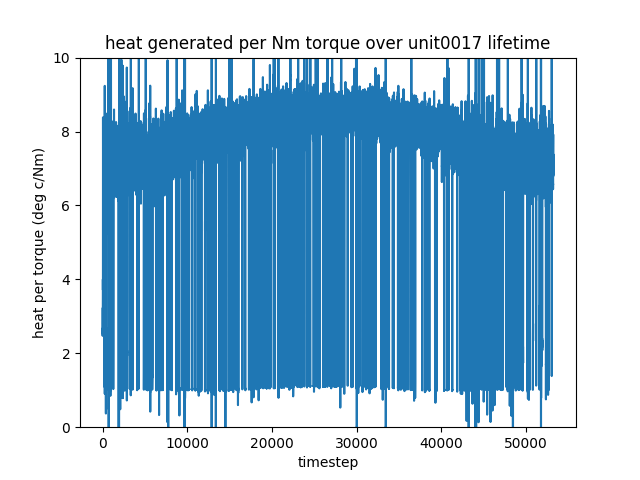

<IPython.core.display.Javascript object>


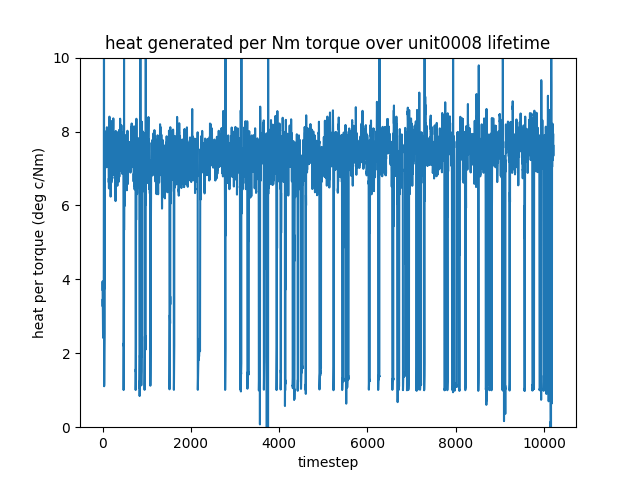

<IPython.core.display.Javascript object>


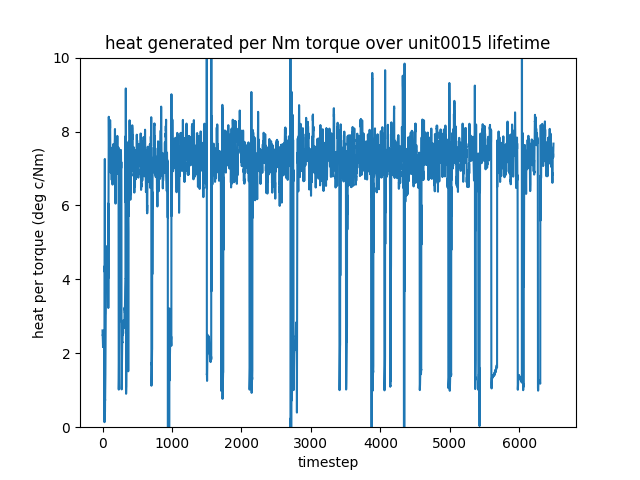

<IPython.core.display.Javascript object>


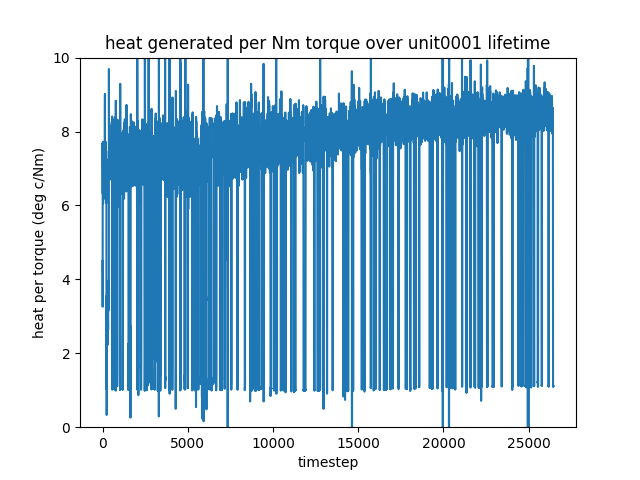

In [40]:
#Comparing time plots from multiple data sets. First, trying out plotting temp diff/torque ratio over time,
#to observe any patterns. 

for key in all_data.keys():
    unit = all_data[key]['rms_smoothed']

    heat_vs_torque = unit['temp_diff']/unit['torque']

    plt.figure()
    plt.plot(heat_vs_torque.values)
    plt.title("heat generated per Nm torque over {} lifetime".format(key))
    plt.ylabel("heat per torque (deg c/Nm)")
    plt.xlabel("timestep")
    plt.ylim((0, 10)) #still some noise here, I think. 

    
#this seems to reinforce the conclusions from earlier - it's very clearly either 1 or around 7. It also appears to be
#slightly periodic. 

total lifetime for unit0009: 69 days 18:39:07.284085


/home/edward/jobsearch/data-science-challenge/.venv/lib/python3.5/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


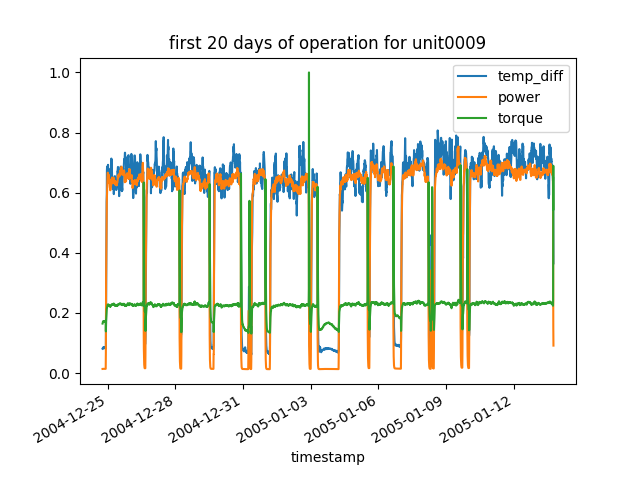

<IPython.core.display.Javascript object>


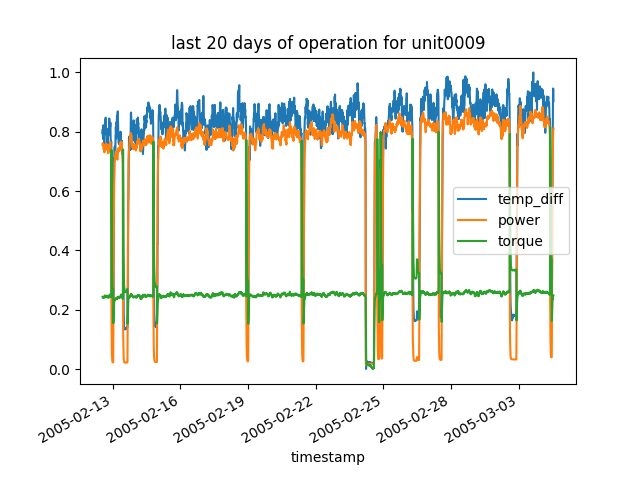

total lifetime for unit0006: 1110 days 22:01:37.303089


<IPython.core.display.Javascript object>


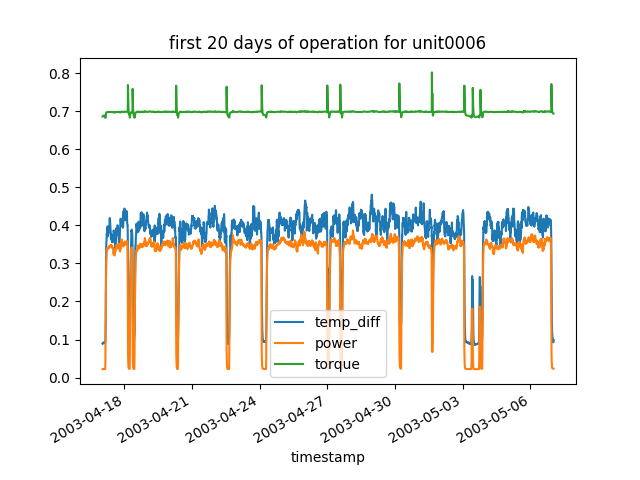

<IPython.core.display.Javascript object>


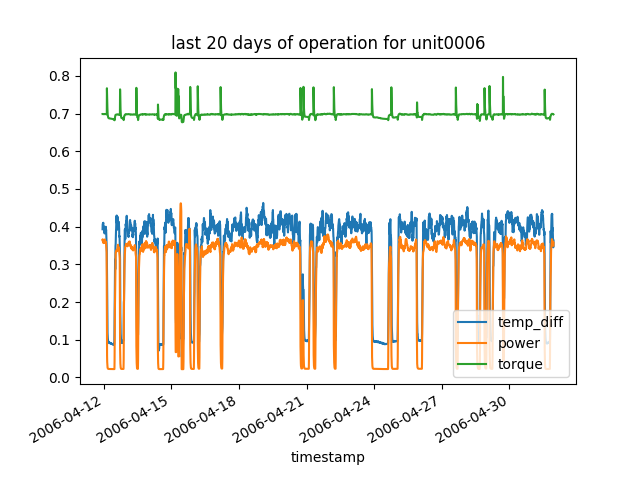

total lifetime for unit0016: 475 days 04:10:54.880957


<IPython.core.display.Javascript object>


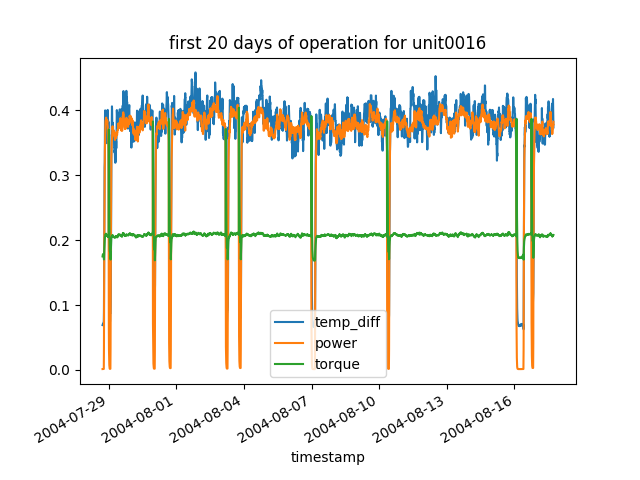

<IPython.core.display.Javascript object>


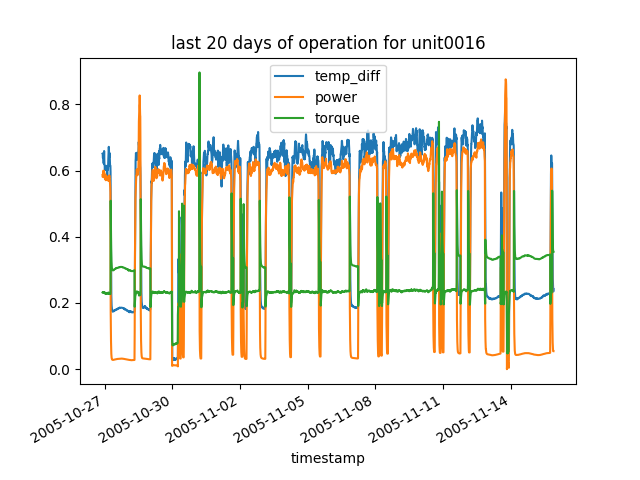

total lifetime for unit0018: 522 days 02:28:55.333584


<IPython.core.display.Javascript object>


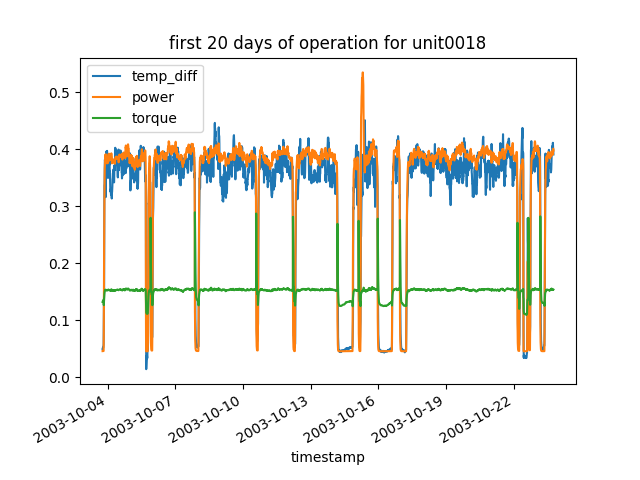

<IPython.core.display.Javascript object>


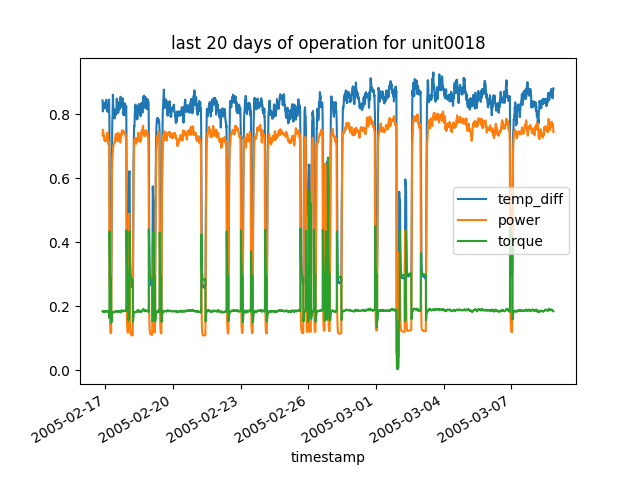

total lifetime for unit0002: 46 days 06:11:51.377401


<IPython.core.display.Javascript object>


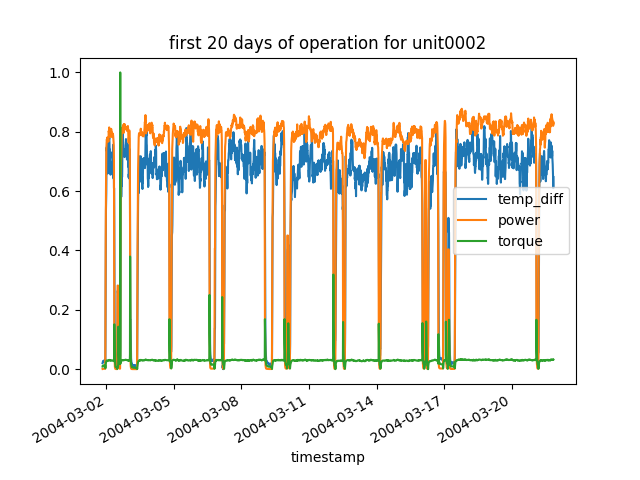

<IPython.core.display.Javascript object>


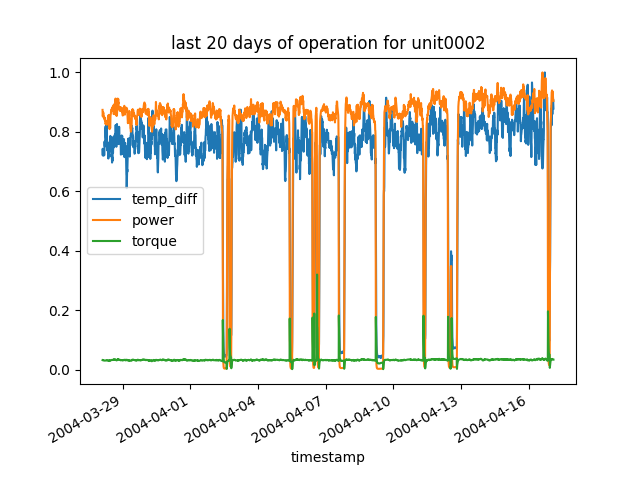

total lifetime for unit0007: 241 days 15:11:22.559698


<IPython.core.display.Javascript object>


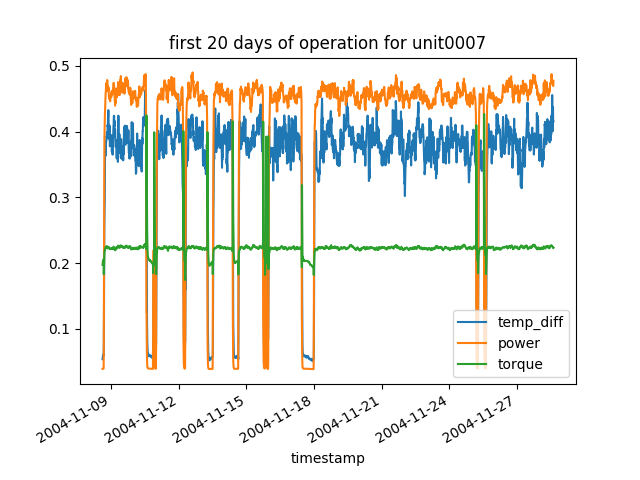

<IPython.core.display.Javascript object>


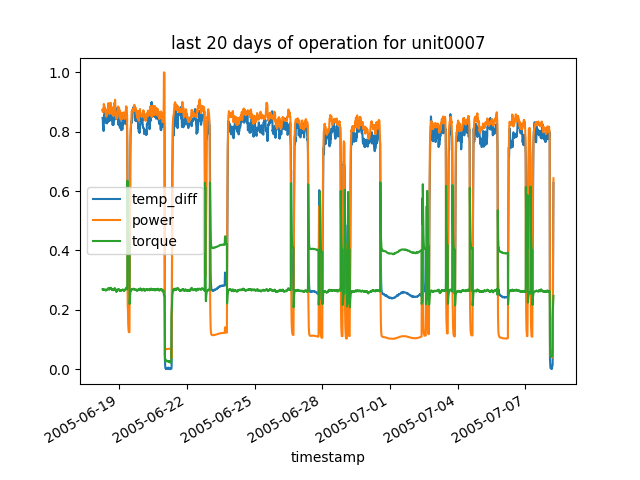

total lifetime for unit0010: 223 days 05:10:10.643853


<IPython.core.display.Javascript object>


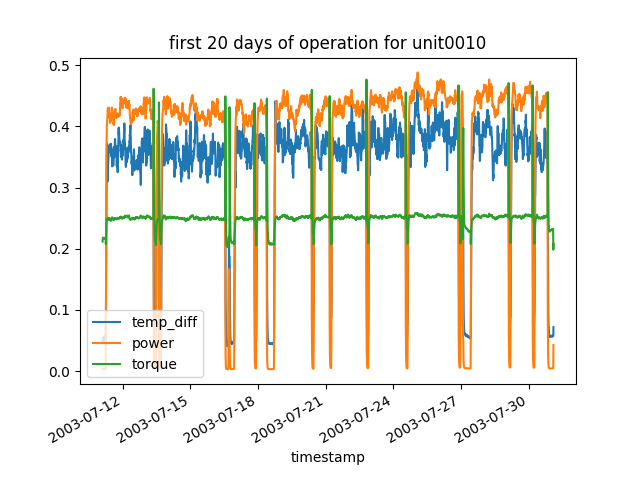

<IPython.core.display.Javascript object>


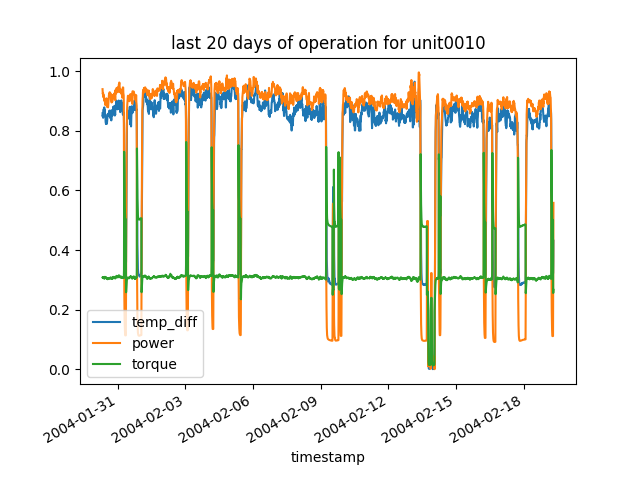

total lifetime for unit0003: 861 days 13:07:25.627538


<IPython.core.display.Javascript object>


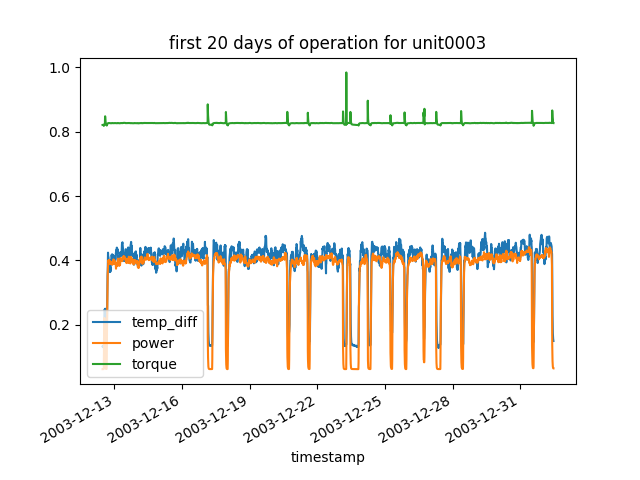

<IPython.core.display.Javascript object>


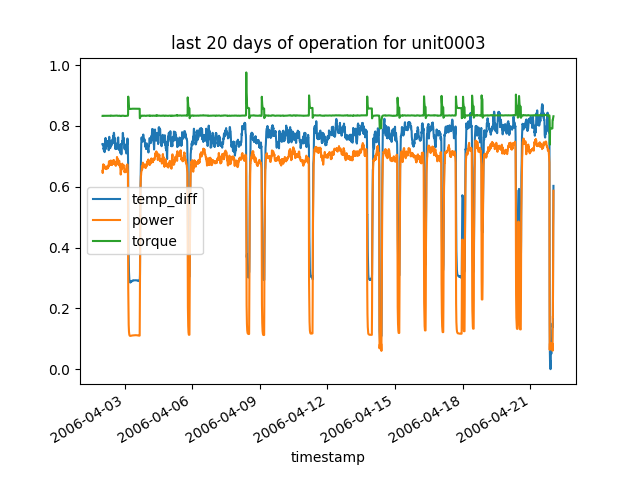

total lifetime for unit0005: 518 days 07:49:54.067565


<IPython.core.display.Javascript object>


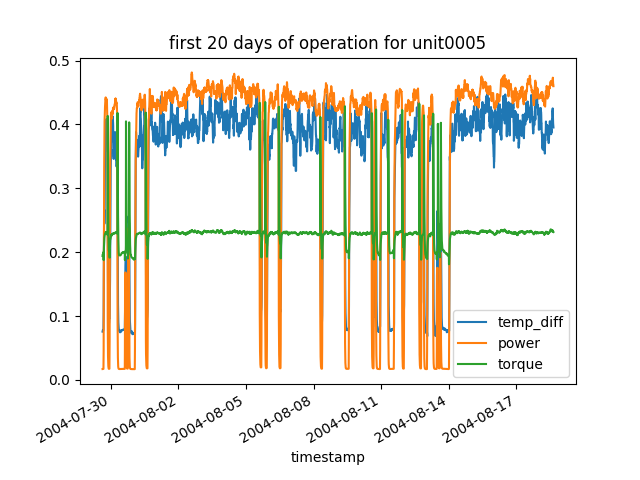

<IPython.core.display.Javascript object>


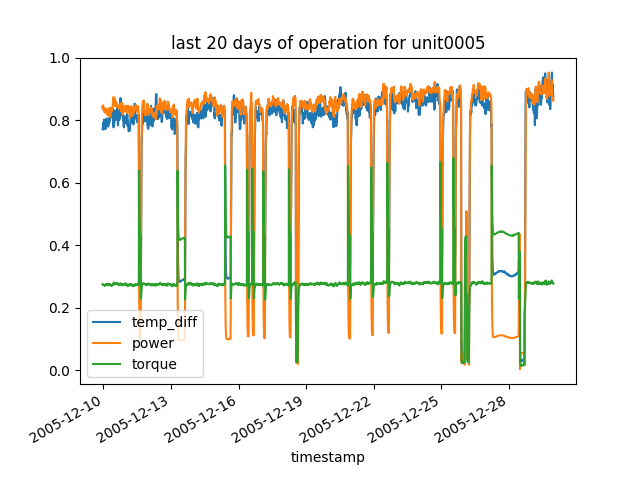

total lifetime for unit0004: 334 days 03:10:50.507582


<IPython.core.display.Javascript object>


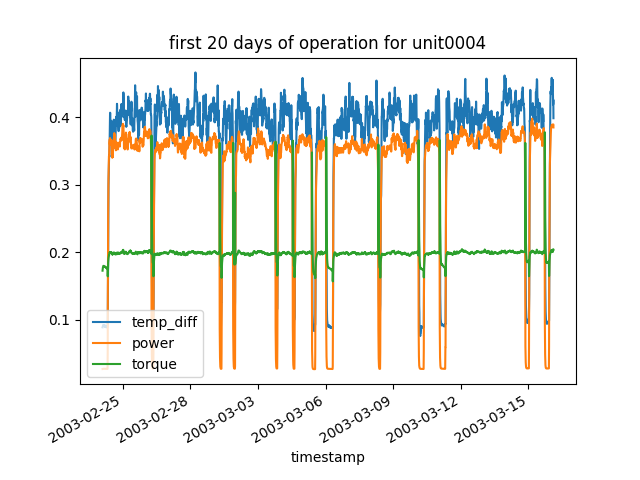

<IPython.core.display.Javascript object>


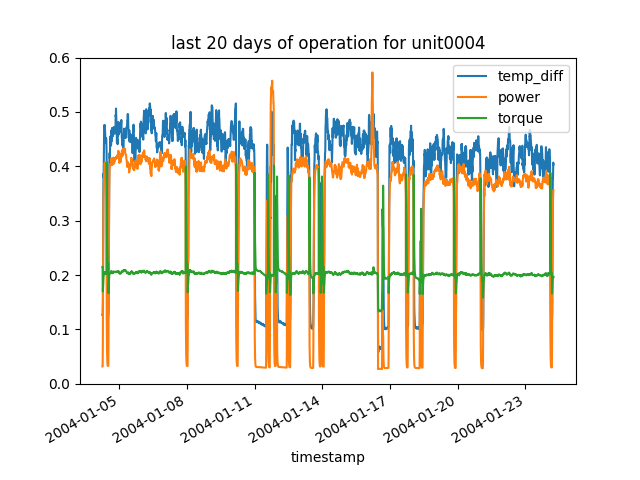

total lifetime for unit0019: 169 days 00:11:23.523179


<IPython.core.display.Javascript object>


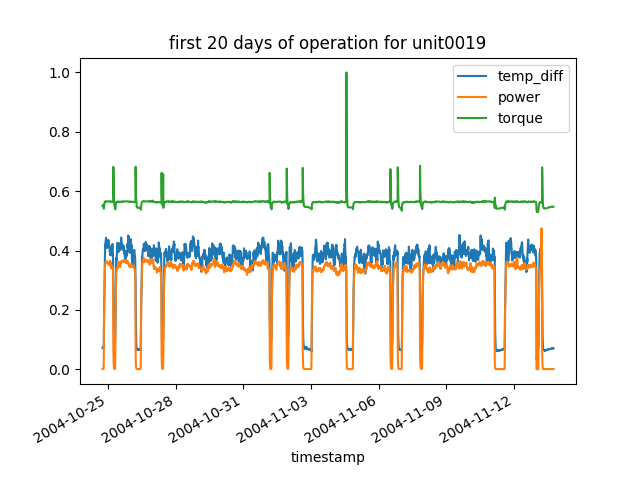

<IPython.core.display.Javascript object>


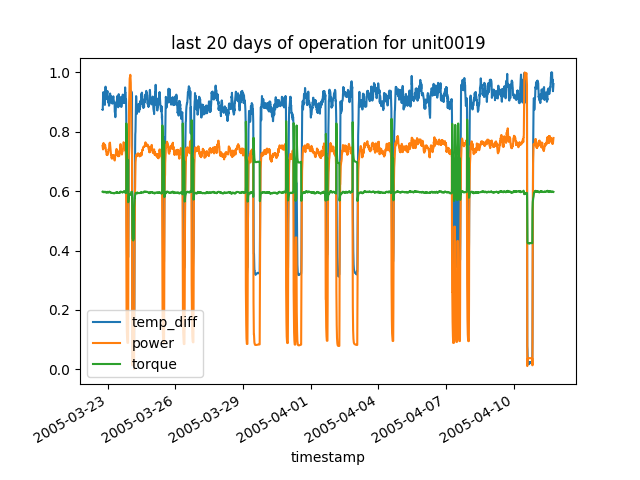

total lifetime for unit0014: 32 days 15:31:02.318140


<IPython.core.display.Javascript object>


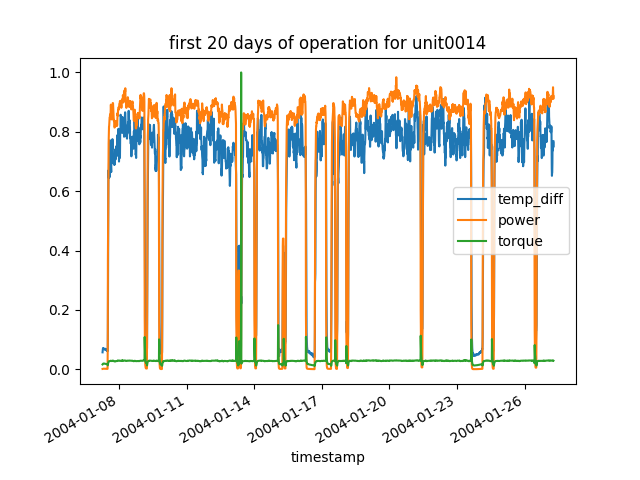

<IPython.core.display.Javascript object>


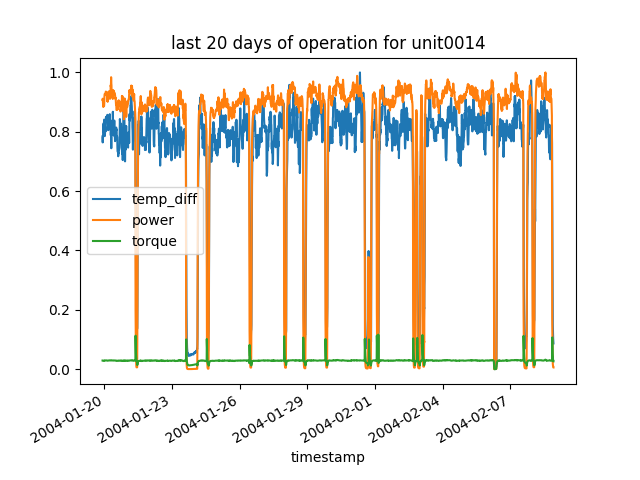

total lifetime for unit0012: 549 days 18:10:16.463934


<IPython.core.display.Javascript object>


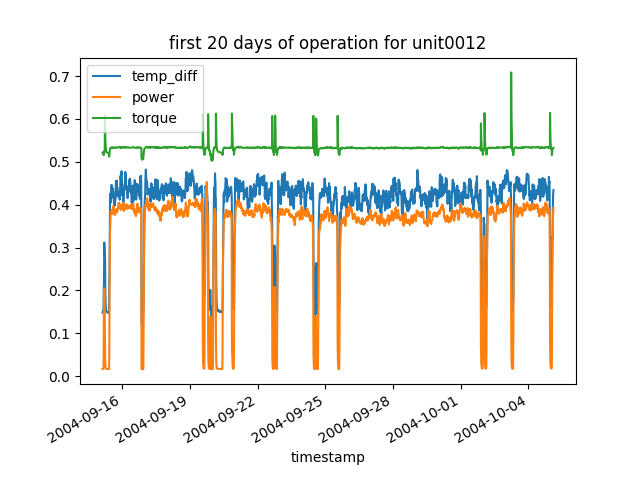

<IPython.core.display.Javascript object>


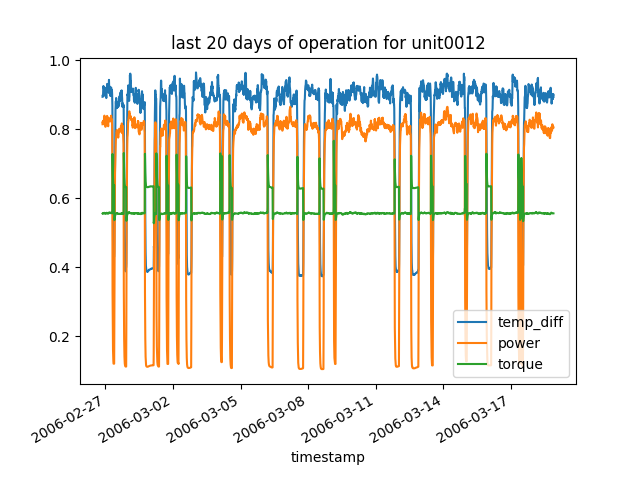

total lifetime for unit0011: 403 days 22:10:03.339355


<IPython.core.display.Javascript object>


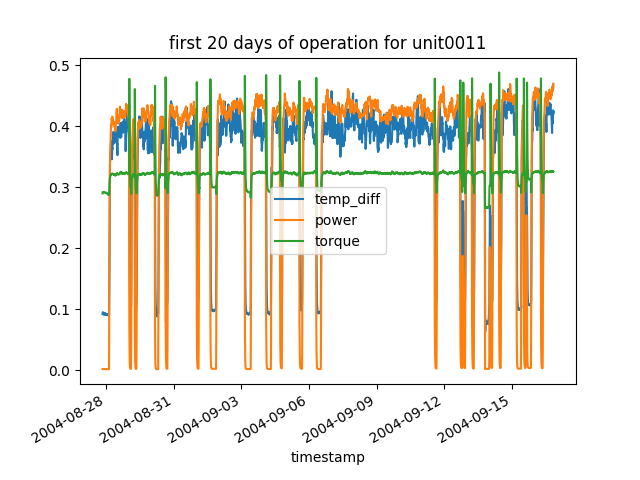

<IPython.core.display.Javascript object>


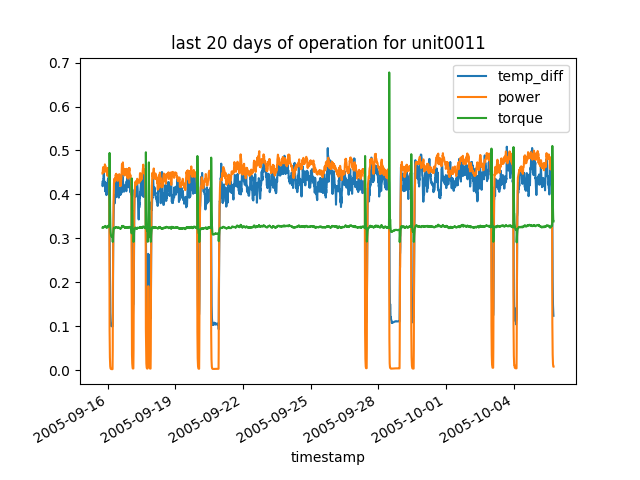

total lifetime for unit0000: 636 days 20:05:12.450332


<IPython.core.display.Javascript object>


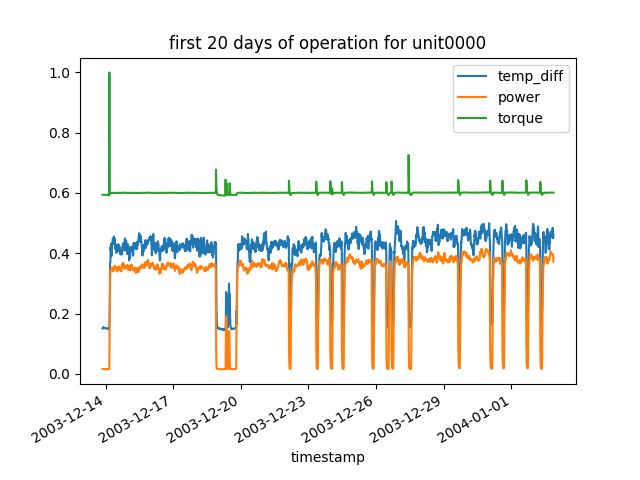

<IPython.core.display.Javascript object>


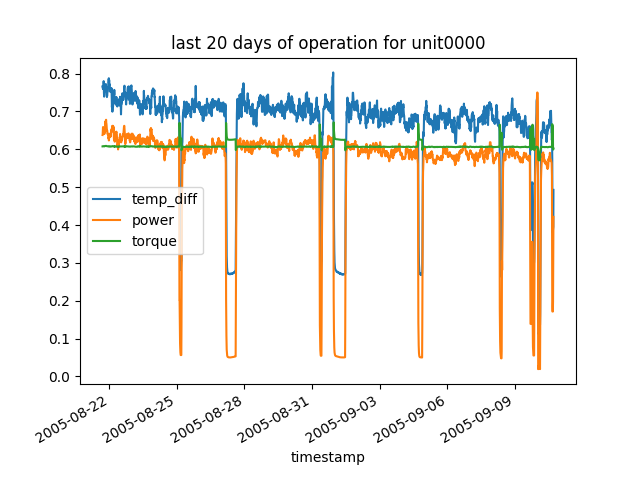

total lifetime for unit0013: 9 days 20:20:22.225734


<IPython.core.display.Javascript object>


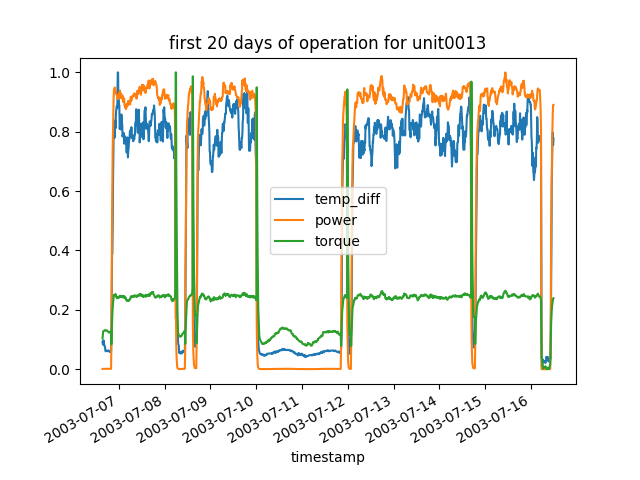

<IPython.core.display.Javascript object>


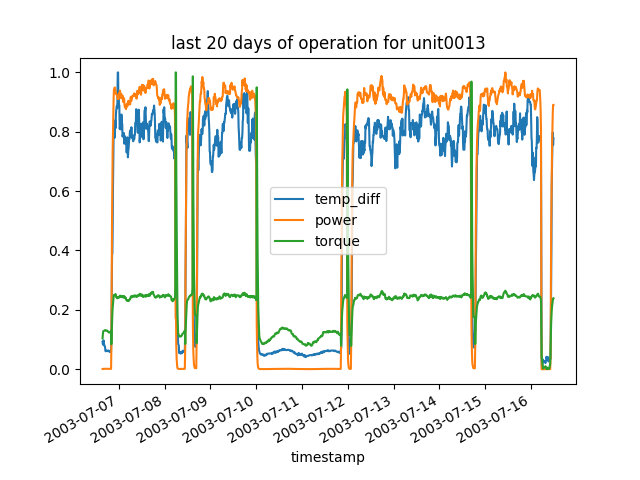

total lifetime for unit0017: 369 days 17:27:58.833434


<IPython.core.display.Javascript object>


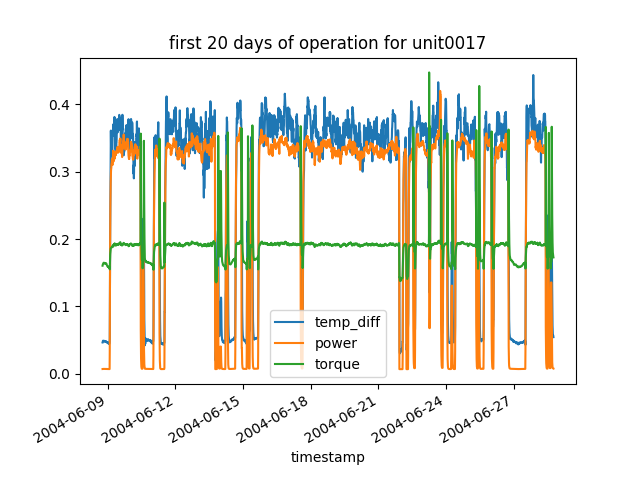

<IPython.core.display.Javascript object>


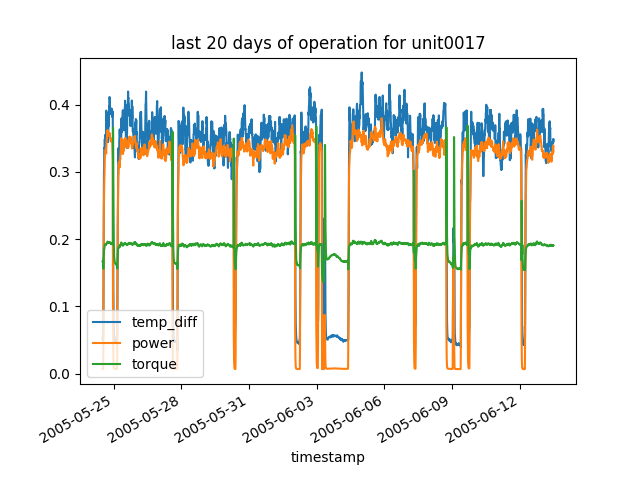

total lifetime for unit0008: 70 days 22:22:25.057222


<IPython.core.display.Javascript object>


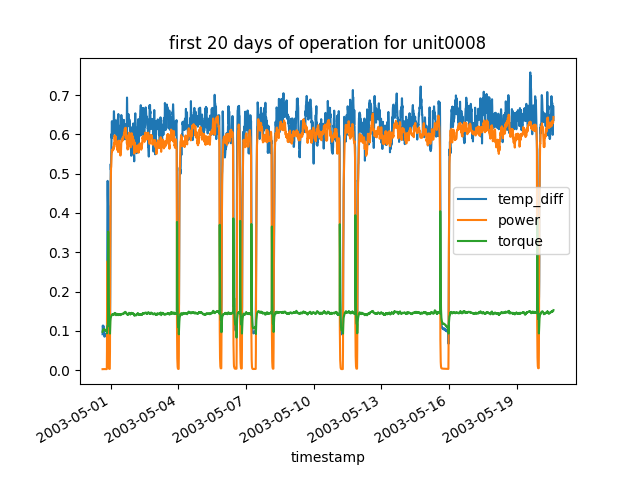

<IPython.core.display.Javascript object>


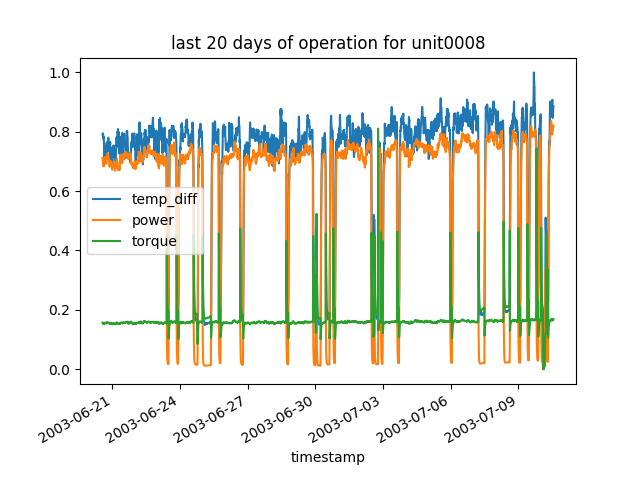

total lifetime for unit0015: 45 days 02:11:05.913383


<IPython.core.display.Javascript object>


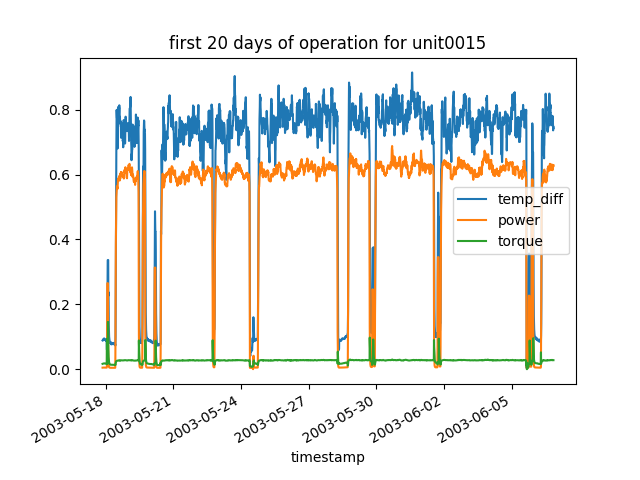

<IPython.core.display.Javascript object>


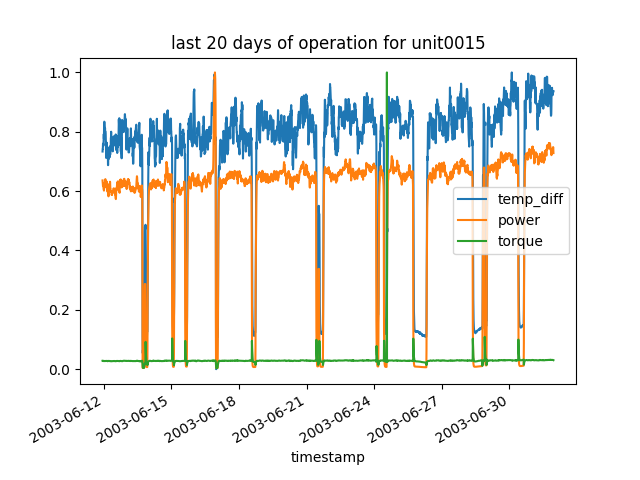

total lifetime for unit0001: 183 days 16:20:28.409875


<IPython.core.display.Javascript object>


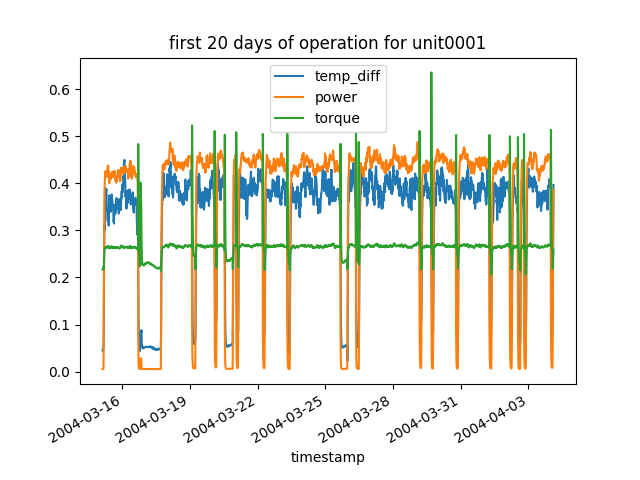

<IPython.core.display.Javascript object>


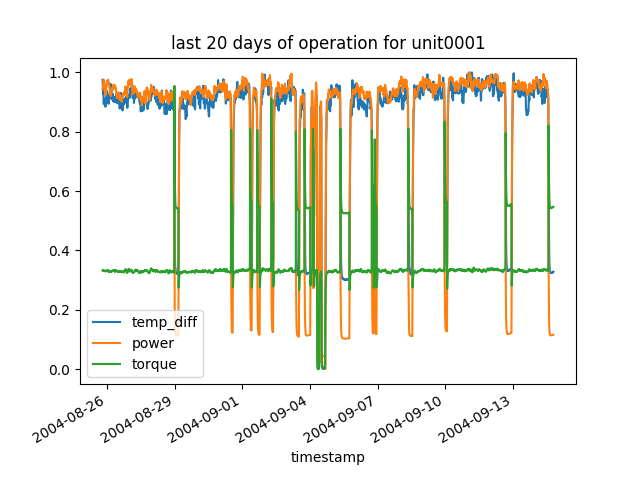

In [44]:
#Next, looking at general trends in multiple data sets.

data_sets = ['unit0000', 'unit0001', 'unit0002', 'unit0003', 'unit0004', 'unit0005', 'unit0006', 'unit0007']

n_days = 20

delta = pd.Timedelta("{} days".format(n_days))

#chosen for easy visualization.
feature_set = ["temp_diff", "power", "torque"]

for data_set in all_data.keys():
    #plotting both the first and last week. 
    dat = all_data[data_set]['rms_normalized']
    last_obs = dat.index[-1]
    first_obs = dat.index[0]
    
    lifetime = last_obs - first_obs
    
    one_wk_prior = last_obs - delta
    first_wk = first_obs + delta
    
    print("total lifetime for {}: {}".format(data_set, lifetime))
    
    dat[feature_set][first_obs:first_wk].plot()
    plt.title("first {} days of operation for {}".format(n_days, data_set))
    
    
    dat[feature_set][one_wk_prior:last_obs].plot()

    plt.title("last {} days of operation for {}".format(n_days, data_set))
    
    

#All "modes" of operation appear pretty tightly correlated - I can't identify an immediate difference by sight.
#However, the data also looks like it may exhibit some periodicity. 


# Fourier Analysis

The different sequences may have some periodic structure that governs when they switch operating modes. I hypothesize that shorter-lived motors will have a stronger high-frequency component than longer-lived motors, which could lead to degredation. However, it will be difficult to detect low-frequency components in shorter-lived motors, due to the smaller observation window, so comparisons may not be perfectly valid. 



/home/edward/jobsearch/data-science-challenge/.venv/lib/python3.5/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


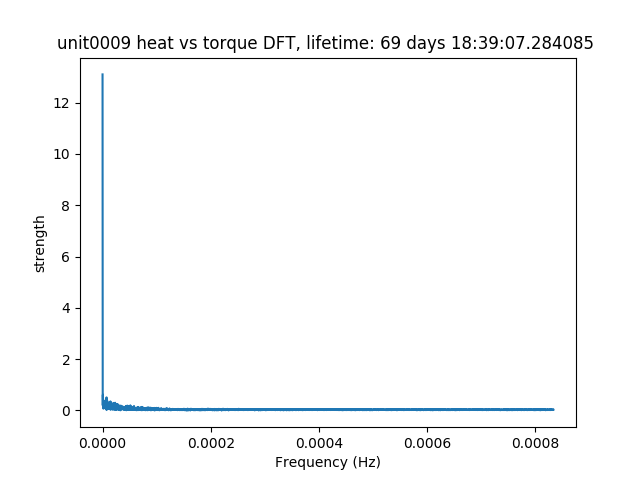

<IPython.core.display.Javascript object>


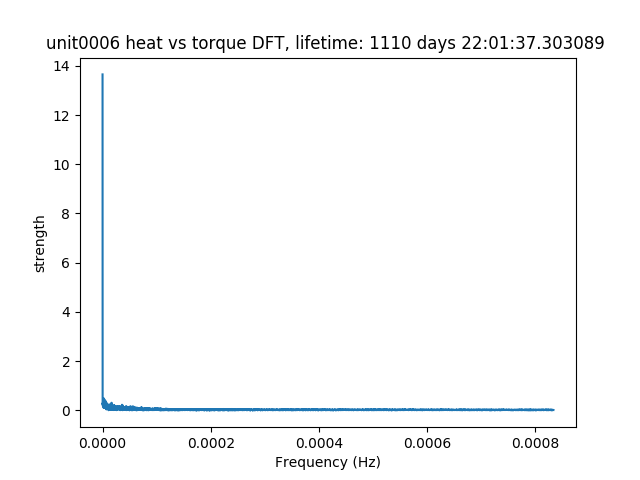

<IPython.core.display.Javascript object>


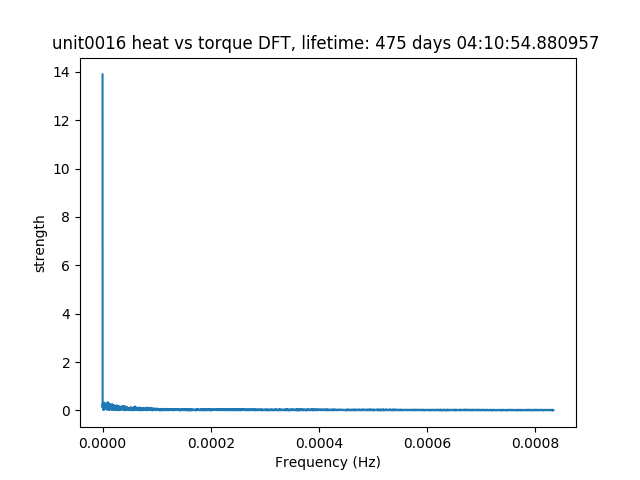

<IPython.core.display.Javascript object>


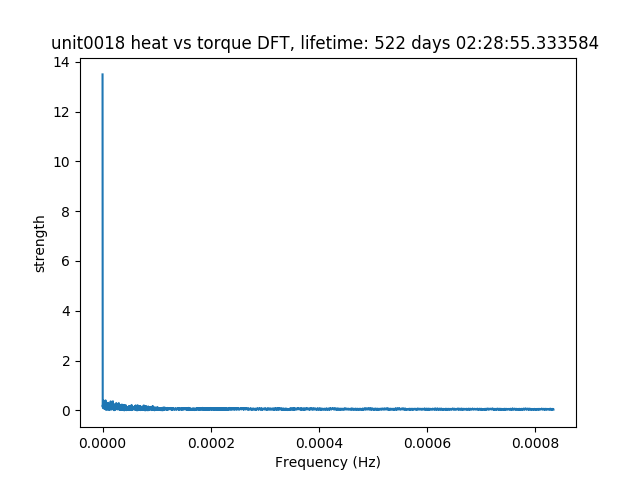

<IPython.core.display.Javascript object>


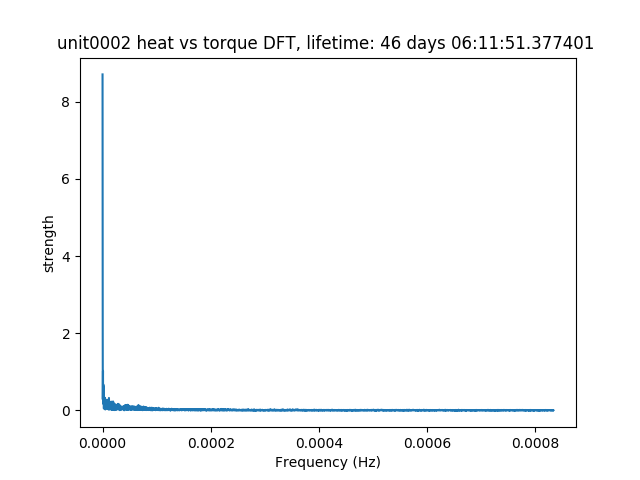

<IPython.core.display.Javascript object>


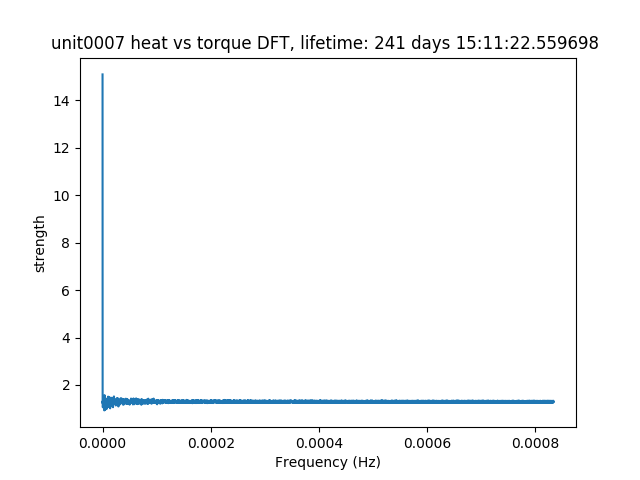

<IPython.core.display.Javascript object>


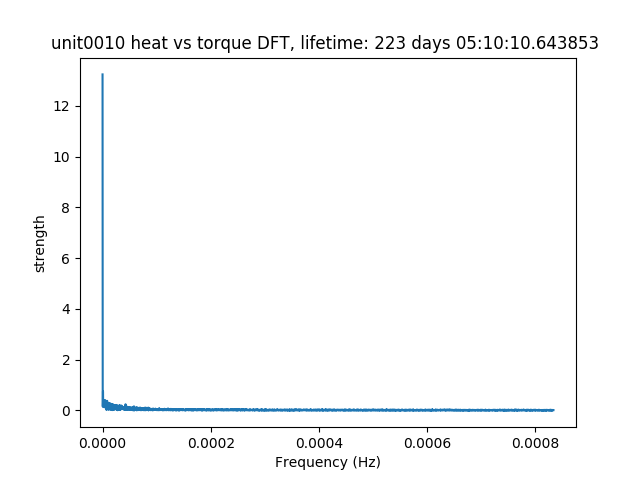

<IPython.core.display.Javascript object>


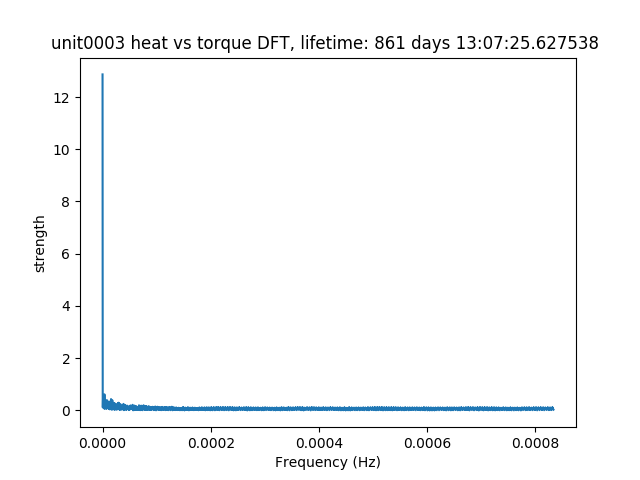

<IPython.core.display.Javascript object>


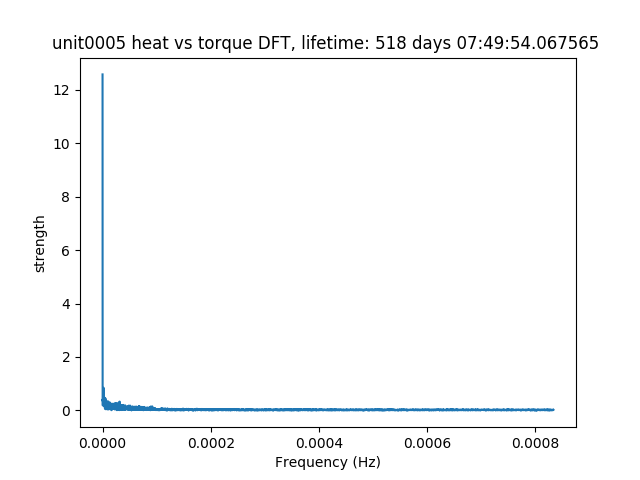

<IPython.core.display.Javascript object>


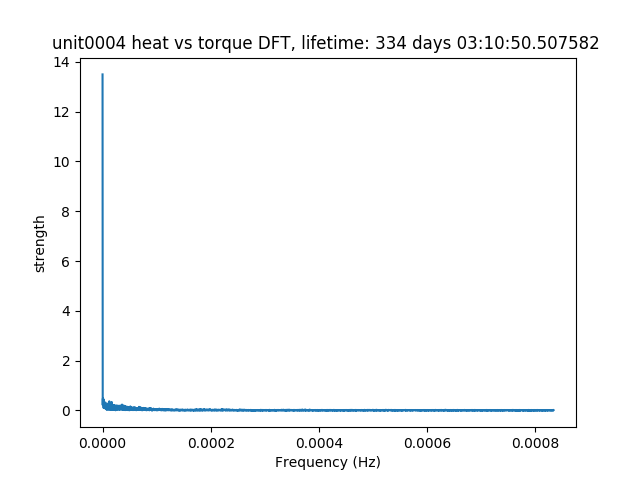

<IPython.core.display.Javascript object>


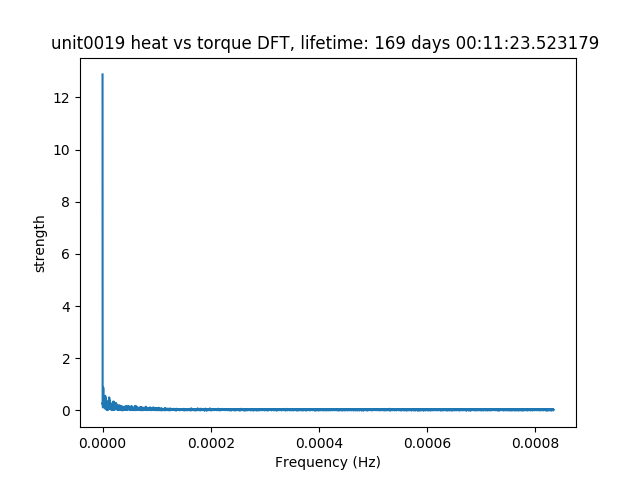

<IPython.core.display.Javascript object>


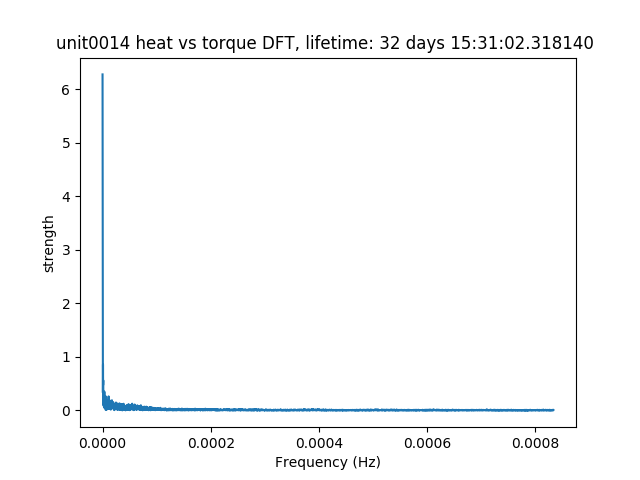

<IPython.core.display.Javascript object>


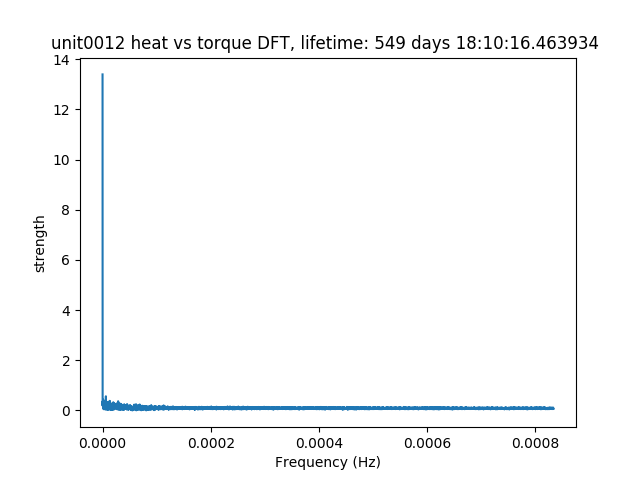

<IPython.core.display.Javascript object>


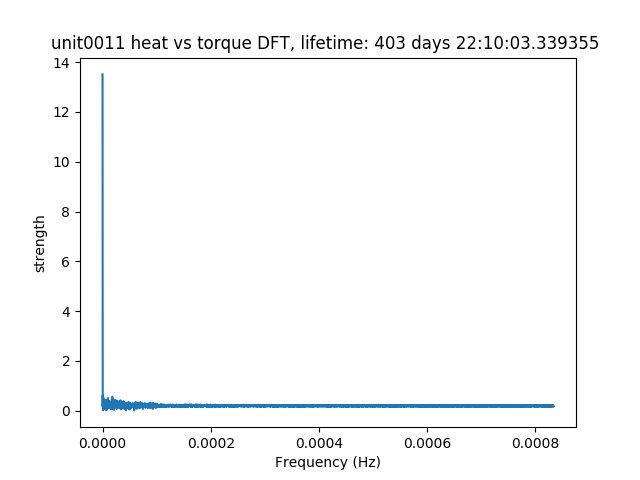

<IPython.core.display.Javascript object>


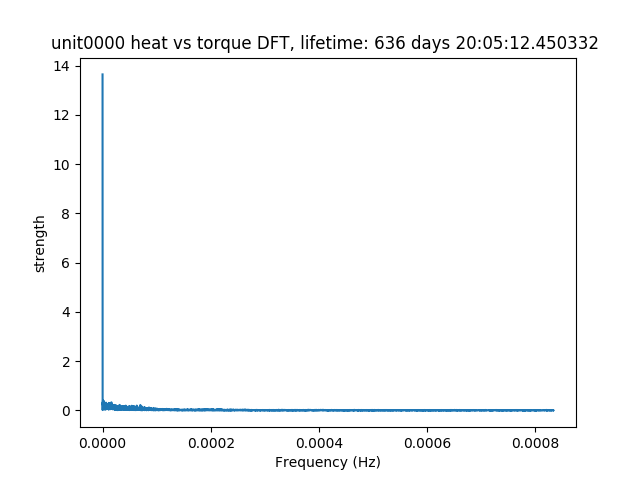

<IPython.core.display.Javascript object>


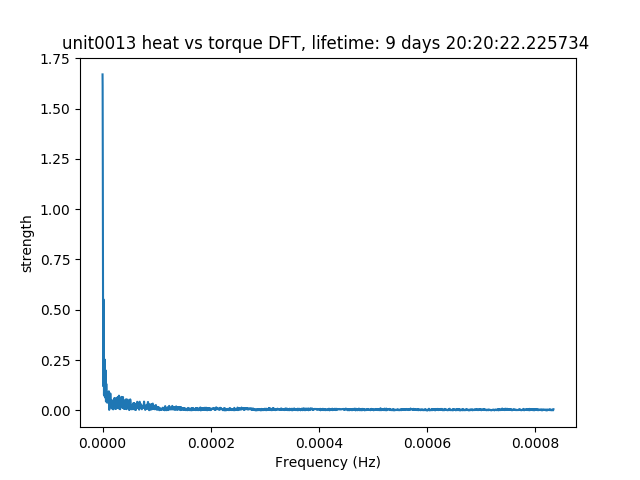

<IPython.core.display.Javascript object>


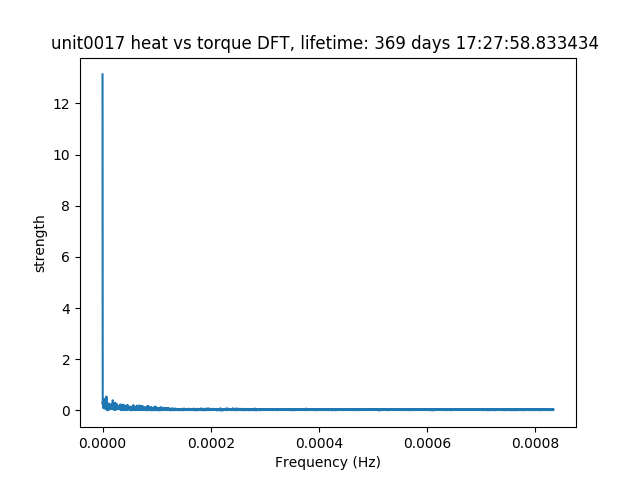

<IPython.core.display.Javascript object>


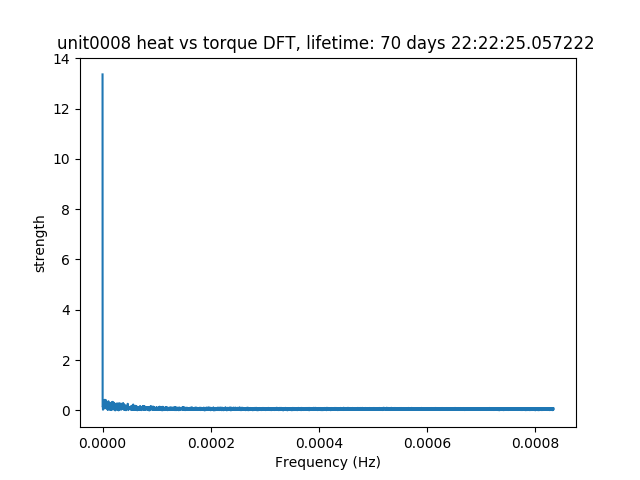

<IPython.core.display.Javascript object>


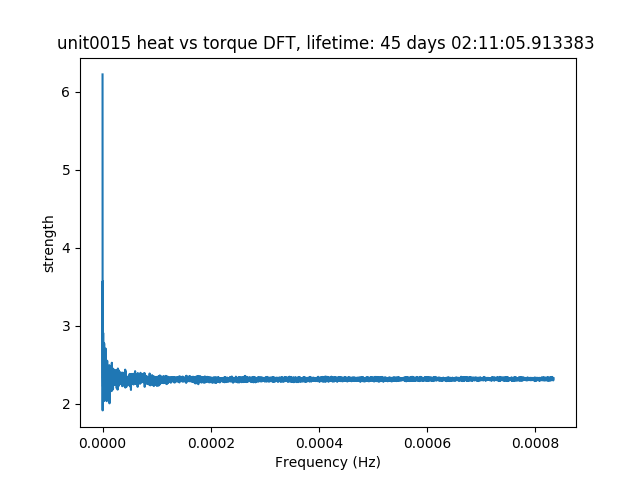

<IPython.core.display.Javascript object>


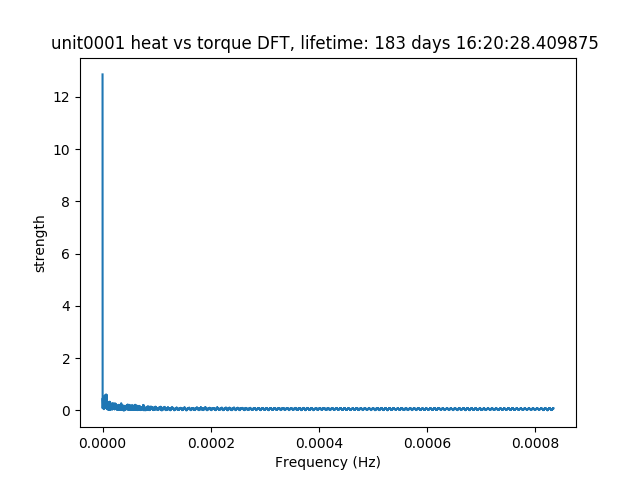

In [49]:
#Starting off with the heat vs torque data for Fourier analysis. Is there a pattern here?

N = 10000 #number of frequency bins. 

#sampling frequency approx once every 10 mins

T = 60*10 #seconds


delta = pd.Timedelta("{} days".format(n_days))

from scipy.fftpack import fft, fftfreq

for key in all_data.keys():
    unit = all_data[key]['rms_smoothed']

    heat_vs_torque = unit['temp_diff']/unit['torque']
    
    last_obs = unit.index[-1]
    first_obs = unit.index[0]
    
    lifetime = last_obs - first_obs

    yf = fft(heat_vs_torque, N)
    #frequency bins
    xf = np.linspace(0.0, 1.0/(2.0*T), N//2)

    # print(unit0_rpm_freq)

    plt.figure()
    #plotting tips from https://stackoverflow.com/questions/25735153/plotting-a-fast-fourier-transform-in-python
    plt.plot(xf, 2.0/N * np.abs(yf[0:N//2]))
    plt.ylabel("strength")
    plt.xlabel("Frequency (Hz)")
    plt.title("{} {} DFT, lifetime: {} ".format(key, "heat vs torque", lifetime))


  

# DFT Conclusions

A significant constant term is expected, as the majority of the timeseries is spent at the same value with little variation. As well, there appears to be some signal in the low-frequency component of shorter-lived 

# MODELING NOTES:
    
Our goals are twofold: Use the data presented (as well as the modified features discussed above) to fit a model that describes the system's underlying dynamics and system health that allows for (limited) forecasting of future data, ideally with a probability distribution on future predictions. Then, use the learned system model to develop a model that estimates the lifetime of the system as a function of observations over a given window. 

From the above data exploration and visualization, it is clear that the data exhibits significant clustering that seem to correspond to different operating modes or behaviors of the motor. Therefore, system models should include some notion of hidden state that produces different distributions on observed parameters. I hypothesize that the sequence of hidden states leading up to failure contains a signal that can be used to predict failure, or bound the estimate of lifetime - indicating degradation of components or stress on the motor that leads to equipment failure. This sequence can be used as input features to a failure prediction model. 

First-pass candidate models for step 1:
- Hidden Markov Model with categorial hidden states and Gaussian emission probabilities. The aforementioned clustering properties could be captured by multivariate Gaussians as a first pass, and there is clearly a temporal relationship between each operating mode. The final hidden state assignments are easily interpretable as discrete modes of operation, and forecasting can be performed by sampling from the Markov chain. 
-  Recurrent Neural Network (RNN) forecasting model, where a RNN with a provided time window is used to predict the next timestep's observation vector. This model can capture a rich hidden state space that may provide an excellent encoding as input to a survival time estimator. However, the model will be difficult to interpret, and estimations of model uncertainty in deep neural networks are complex. 

Therefore, I will follow the following procedure: Discretize the data into a categorial sequence of operating modes via Gaussian HMM sequence fitting, then use that sequence to generate features that can be used to estimate a  regression model predicting if the failure will occur in a given window. 



In [58]:
#fitting HMM

from hmmlearn.hmm import GaussianHMM

#using a subset of features. 
features = ['power', 'torque', 'temp_diff', 'warning_occured']

#reformatting to train model
all_seqs = [all_data[key]['rms_normalized'][features].values for key in all_data.keys()]
all_lens = [seq.shape[0] for seq in all_seqs]
concat = np.concatenate(all_seqs)

#trying with three states
num_states = 3

import warnings

#depreciation warning 

with warnings.catch_warnings():
    #starting off with 3 components
    warnings.filterwarnings('ignore', category=DeprecationWarning)
    model = GaussianHMM(n_components=num_states, verbose=True).fit(concat, all_lens)
    
    log_prob = model.score(concat, all_lens)

         1     1654541.0072             +nan
         2     2668903.3079    +1014362.3006
         3     7457816.4019    +4788913.0941
         4     8532839.0068    +1075022.6049
         5     8686329.6930     +153490.6862
         6     8785700.4555      +99370.7625
         7     8831873.7426      +46173.2870
         8     8896989.6807      +65115.9382
         9     8912222.9897      +15233.3089
        10     8918130.7223       +5907.7326


In [59]:
#generating state sequences for all sequences in training set

for key in all_data.keys():
    feats = all_data[key]['rms_normalized'][features].values 
    all_data[key]['estimated_sequence'] = model.predict(feats)
    

/home/edward/jobsearch/data-science-challenge/.venv/lib/python3.5/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/edward/jobsearch/data-science-challenge/.venv/lib/python3.5/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/edward/jobsearch/data-science-challenge/.venv/lib/python3.5/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarn

In [74]:
#Using distribution of HMM states in a given window to estimate features for a logistic regression model:

#modeling the probability that failure will occur in the next 24 hours as a function of the hidden states' frequency.

#the obvious failure mode here is that the data will be weighted so heavily in favor of "not failing"
#that the estimator may learn to predict inaccurately. 

from sklearn.linear_model import LogisticRegression

hrs_before_failure = 24

window_size = 100 #timesteps

delta = pd.Timedelta("{} hours".format(hrs_before_failure))

#holding inputs and labels for each example. Will be concatenated together to train full. 
freqs, labels = [], []

for key in all_data.keys():
    dat = all_data[key]['rms_normalized']
    #if the timestep occcured this 
    failed_in_limit = (dat.index[-1] - dat.index) < delta

    assignments = pd.Series(all_data[key]['estimated_sequence'], index=dat.index)

    #use the rolling window to produce hidden state frequency features
    windows = assignments.rolling(window_size)



    freqs_key = np.zeros((len(dat) - window_size + 1, num_states))


    for i in range(num_states):
        freq_i = windows.apply(lambda x: np.sum(x == i)/window_size, raw=True)
        #removing early values with no window assignment. 
        freqs_key[:,i] = freq_i.dropna().values
    
    freqs.append(freqs_key)
    labels.append(failed_in_limit[window_size - 1:])
    
    
#train logistic regression model

all_freqs = np.concatenate(freqs, axis=0)
all_labels = np.concatenate(labels)

model = LogisticRegression(verbose=True, penalty='l2')
model.fit(all_freqs, all_labels)

#testing on training data for debug
out = model.predict(all_freqs)
print(model.accuracy(all_freqs, all_labels))
sum(out) #does in fact always predict 0 - gets it close enough. 

[LibLinear]

0

# Conclusions

I'm unfortunately running out of time, and I don't think I found the signal in the data. Rather than throwing my existing models at the test data, here's a brief discussion about the results. The Logistic Regression model's classification-based approach does not seem to be effective. Compressing the sequence using unsupervised clustering may reduce noise, but if the clustering fit is poor then building features on top of those results will be ineffective. The failure of the logistic regression model alone isn't surprising - there aren't as many positive examples as one would like, and the binary "will fail" "will not fail" classification is less useful than a probability and harder to fit to. 

A better approach would likely have been to develop sequence-level features and feed them into a Cox Proportional Hazard, or more robust time-series features  and feed them into time-varying hazard model (http://lifelines.readthedocs.io/en/latest/Survival%20Regression.html#cox-s-time-varying-proportional-hazard-model). The hazard model is a better analogue to the underlying task, which is to predict a failure probability as a function of observed features. That was the intent behind the Fourier analysis, but I couldn't identify a set of features that could be easily extracted from the Fourier transform and used as covariates for a Cox model. 

In terms of forecasting models, a Gaussian Process autoregression model would place likelihood bounds on future prediction while also being able to capture the periodic or semi-periodic nature of the process, using a periodic kernel.

Thank you for reading! Any feedback or future study tips would be greatly appreciated. 